## Topic: Forecast the prices of Avocado in the US

#####  About the dataset

Content This data was downloaded from the Hass Avocado Board website in May of 2018 & compiled into a single CSV. Here's how the Hass Avocado Board describes the data on their website:

The table below represents weekly 2018 retail scan data for National retail volume (units) and price. Retail scan data comes directly from retailers’ cash registers based on actual retail sales of Hass avocados. Starting in 2013, the table below reflects an expanded, multi-outlet retail data set. Multi-outlet reporting includes an aggregation of the following channels: grocery, mass, club, drug, dollar and military. The Average Price (of avocados) in the table reflects a per unit (per avocado) cost, even when multiple units (avocados) are sold in bags. The Product Lookup codes (PLU’s) in the table are only for Hass avocados. Other varieties of avocados (e.g. greenskins) are not included in this table.

Some relevant columns in the dataset:

 * Date - The date of the observation
 * AveragePrice - the average price of a single avocado 
 * type - conventional or organic 
 * year - the year
 * Region - the city or region of the observation
 * Total Volume - Total number of avocados sold 
 * 4046 - Total number of avocados with PLU
 * 4046 sold
 * 4225 - Total number of avocados with PLU 4225 sold
 * 4770 - Total number of avocados with PLU 4770 sold 
Acknowledgements Many thanks to the Hass Avocado Board for sharing this data!!

http://www.hassavocadoboard.com/retail/volume-and-price-data




##### Objectives:
The project will forcus on:
 * Model selection for Price Prediction of Avocado in whole dataset
 * Prediction of Avocado Price based on timeseries to evaluate the expansion likelihood.

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from fbprophet import Prophet 
from fbprophet.plot import add_changepoints_to_plot

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

import pandas_profiling as pp

import re
import scipy

import statsmodels.api as sm
from sklearn.preprocessing import OneHotEncoder
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

import warnings
warnings.filterwarnings("ignore")

from scipy.stats import chi2_contingency
from scipy.stats import chi2

import statsmodels.api as sm
from statsmodels.formula.api import ols

import datetime
import math
from sklearn.model_selection import train_test_split



In [3]:
data = pd.read_csv('avocado.csv', index_col=0)

### Data understanding

In [4]:
data.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [15]:
df=data.copy(deep=True)

In [16]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
df.isnull().any()

Date            False
AveragePrice    False
Total Volume    False
4046            False
4225            False
4770            False
Total Bags      False
Small Bags      False
Large Bags      False
XLarge Bags     False
type            False
year            False
region          False
dtype: bool

In [18]:
df.duplicated().any()

False

In [19]:
df.shape

(18249, 13)

##### Comments:
 * There is no missing data, duplicate data
 * Total Volume có high correlation với 4046, 4225, Total Bags và Small Bags

In [20]:
#list of Categoricals variable
objects=[f for f in df.columns if df.dtypes[f]=='object']  
print('list of Categorical variables: ', objects)

list of Categorical variables:  ['Date', 'type', 'region']


In [21]:
i=1
for obj in objects:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', df[obj].unique() if len(df[obj].unique()) else '')
    i=i+1

1 / Date 	 169 : ['2015-12-27' '2015-12-20' '2015-12-13' '2015-12-06' '2015-11-29'
 '2015-11-22' '2015-11-15' '2015-11-08' '2015-11-01' '2015-10-25'
 '2015-10-18' '2015-10-11' '2015-10-04' '2015-09-27' '2015-09-20'
 '2015-09-13' '2015-09-06' '2015-08-30' '2015-08-23' '2015-08-16'
 '2015-08-09' '2015-08-02' '2015-07-26' '2015-07-19' '2015-07-12'
 '2015-07-05' '2015-06-28' '2015-06-21' '2015-06-14' '2015-06-07'
 '2015-05-31' '2015-05-24' '2015-05-17' '2015-05-10' '2015-05-03'
 '2015-04-26' '2015-04-19' '2015-04-12' '2015-04-05' '2015-03-29'
 '2015-03-22' '2015-03-15' '2015-03-08' '2015-03-01' '2015-02-22'
 '2015-02-15' '2015-02-08' '2015-02-01' '2015-01-25' '2015-01-18'
 '2015-01-11' '2015-01-04' '2016-12-25' '2016-12-18' '2016-12-11'
 '2016-12-04' '2016-11-27' '2016-11-20' '2016-11-13' '2016-11-06'
 '2016-10-30' '2016-10-23' '2016-10-16' '2016-10-09' '2016-10-02'
 '2016-09-25' '2016-09-18' '2016-09-11' '2016-09-04' '2016-08-28'
 '2016-08-21' '2016-08-14' '2016-08-07' '2016-07-31' '2016-

In [22]:
#Drop 'TotalUS' which is pointless in this analysis
df=df[df['region']!='TotalUS']
i=1
for obj in objects:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', df[obj].unique() if len(df[obj].unique()) else '')
    i=i+1

1 / Date 	 169 : ['2015-12-27' '2015-12-20' '2015-12-13' '2015-12-06' '2015-11-29'
 '2015-11-22' '2015-11-15' '2015-11-08' '2015-11-01' '2015-10-25'
 '2015-10-18' '2015-10-11' '2015-10-04' '2015-09-27' '2015-09-20'
 '2015-09-13' '2015-09-06' '2015-08-30' '2015-08-23' '2015-08-16'
 '2015-08-09' '2015-08-02' '2015-07-26' '2015-07-19' '2015-07-12'
 '2015-07-05' '2015-06-28' '2015-06-21' '2015-06-14' '2015-06-07'
 '2015-05-31' '2015-05-24' '2015-05-17' '2015-05-10' '2015-05-03'
 '2015-04-26' '2015-04-19' '2015-04-12' '2015-04-05' '2015-03-29'
 '2015-03-22' '2015-03-15' '2015-03-08' '2015-03-01' '2015-02-22'
 '2015-02-15' '2015-02-08' '2015-02-01' '2015-01-25' '2015-01-18'
 '2015-01-11' '2015-01-04' '2016-12-25' '2016-12-18' '2016-12-11'
 '2016-12-04' '2016-11-27' '2016-11-20' '2016-11-13' '2016-11-06'
 '2016-10-30' '2016-10-23' '2016-10-16' '2016-10-09' '2016-10-02'
 '2016-09-25' '2016-09-18' '2016-09-11' '2016-09-04' '2016-08-28'
 '2016-08-21' '2016-08-14' '2016-08-07' '2016-07-31' '2016-

In [23]:
#list of Continuous variables
numbers=[f for f in df.columns if df.dtypes[f]!='object'] 
print('list of Continuous variables: ', numbers)

list of Continuous variables:  ['AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'year']


In [24]:
i=1
for obj in numbers:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', df[obj].unique() if len(df[obj].unique()<150) else '')
    i=i+1

1 / AveragePrice 	 259 : [1.33 1.35 0.93 1.08 1.28 1.26 0.99 0.98 1.02 1.07 1.12 1.31 1.11 1.34
 1.45 1.05 1.37 1.27 1.32 1.23 1.19 1.43 1.2  1.22 1.13 1.16 1.06 1.17
 1.24 0.96 1.   1.09 0.95 0.97 1.15 1.01 1.14 1.1  1.04 1.03 1.18 1.29
 1.25 0.71 0.94 0.91 1.39 1.4  1.36 1.3  1.54 1.59 1.56 1.38 1.49 1.5
 1.47 1.42 1.41 1.44 1.52 0.9  0.87 0.78 0.92 0.83 0.88 0.84 0.85 1.21
 0.79 0.89 0.86 0.8  0.82 0.74 0.81 0.77 0.75 0.65 0.73 0.68 0.72 0.67
 0.76 0.62 0.7  0.66 1.46 0.49 0.53 0.56 0.6  0.58 0.54 0.52 0.51 0.57
 0.63 0.64 0.61 1.48 1.55 1.58 1.53 1.57 1.51 0.69 1.62 1.63 1.61 1.6
 1.73 1.8  1.86 1.85 1.69 1.66 1.65 1.64 1.67 1.68 1.82 2.07 1.84 1.83
 1.7  1.72 1.81 1.78 0.59 1.9  1.93 1.99 1.95 1.89 1.76 1.71 1.74 0.55
 1.79 1.75 1.94 2.2  1.87 1.77 2.06 2.11 2.22 2.14 2.15 2.02 2.   1.88
 1.96 2.19 2.09 1.98 1.97 1.92 2.04 0.46 2.01 2.08 2.03 2.05 2.28 2.35
 2.29 1.91 2.18 2.24 2.12 2.13 2.16 2.32 2.34 2.33 2.31 2.23 2.27 2.3
 2.41 2.36 2.37 2.39 2.42 2.45 2.38 2.4  2.25 2.26 2.17

In [25]:
df.describe()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,17911.000000,1.791100e+04,1.791100e+04,1.791100e+04,17911.000000,1.791100e+04,1.791100e+04,1.791100e+04,17911.000000,17911.000000
mean,1.407619,5.392587e+05,1.838074e+05,1.882231e+05,14551.234381,1.526757e+05,1.162029e+05,3.450569e+04,1967.168041,2016.147898
std,0.404253,1.224332e+06,5.151059e+05,4.519856e+05,48817.536762,3.645992e+05,2.787596e+05,1.139477e+05,8186.402196,0.939939
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000
25%,1.100000,1.057102e+04,8.196600e+02,2.909610e+03,0.000000,4.905195e+03,2.700335e+03,1.129950e+02,0.000000,2015.000000
50%,1.370000,1.001541e+05,7.824430e+03,2.670199e+04,164.230000,3.755102e+04,2.453062e+04,2.459220e+03,0.000000,2016.000000
75%,1.670000,4.001767e+05,1.014888e+05,1.317552e+05,5736.735000,1.036916e+05,7.928259e+04,1.942171e+04,106.760000,2017.000000
max,3.250000,1.127475e+07,5.160897e+06,5.402444e+06,804558.250000,4.145407e+06,3.403581e+06,2.838239e+06,131300.760000,2018.000000


#### Univariate Analysis

In [27]:
# a. Continuous variable
def Continuous_variable_analysis(col, name):
    begin_bold = '\x1b[1m'
    end_bold = '\x1b[0m'
    print('\x1b[1;03;31;47m','Descripble of', name, ':','\x1b[0m')
    print(col.describe(include='all'))
    col_median = col.median()
    col_mode = col.mode()
    col_range = col.max() - col.min()
    Q1 = np.percentile(col.dropna(), 25)
    Q3 = np.percentile(col.dropna(), 75)
    IQR = Q3-Q1
    col_var = col.var()
    col_skew = col.skew()
    if col_skew > 0:
        print('\n', begin_bold, 'skew =', col_skew, ': Right-skewed Distribution', end_bold)
    elif col_skew < 0:
        print('\n', begin_bold,'skew =', col_skew, ': Left-skewed Distribution', end_bold)
    else:
        print('\n', begin_bold,'skew =', col_skew, ': Normal Distribution', end_bold)
    col_kur = col.kurtosis()
    if col_kur > 0:
        print('\n', begin_bold,'kurtosis =', col_kur, ': Leptokurtic distribution.', end_bold)
    elif col_skew < 0:
        print('\n', begin_bold,'kurtosis =', col_kur, ': Platykurtic distribution', end_bold)
    else:
        print('\n', begin_bold,'kurtosis =', col_kur, ': Mesokurtic distribution', end_bold)
    # Visualization
    # Histogram
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    ax1.set_title('Distplot of ' + name)
    sns.distplot(col, ax=ax1)
    ax2.set_title('Histogram of ' + name)
    ax2.hist(col)
    plt.show()
    # Boxplot
    f2, ax = plt.subplots(figsize=(4,6))
    ax.boxplot(col.dropna())
    ax.set_title("Boxplot of " + name)
    plt.show()
    # Number of upper outliers
    n_O_upper = df[col > (Q3 + 1.5*IQR)].shape[0]
    if n_O_upper > 0:
        print('\n', begin_bold, 'Number of upper outliers:', n_O_upper, end_bold)
    # Number of lower outliers
    n_O_lower = df[col < (Q1 - 1.5*IQR)].shape[0]
    if n_O_lower > 0:
        print('\n', begin_bold, 'Number of lower outliers:', n_O_lower, end_bold)
    # Percentage of ouliers
    if n_O_upper > 0 or n_O_lower > 0:
        outliers_per = (n_O_lower + n_O_upper)/df.shape[0]
        print('\n', begin_bold, 'Percentage of ouliers:', outliers_per, end_bold)

 Descripble of AveragePrice : 
count    17911.000000
mean         1.407619
std          0.404253
min          0.440000
25%          1.100000
50%          1.370000
75%          1.670000
max          3.250000
Name: AveragePrice, dtype: float64

  skew = 0.5771324467437444 : Right-skewed Distribution 

  kurtosis = 0.3135389881856314 : Leptokurtic distribution. 


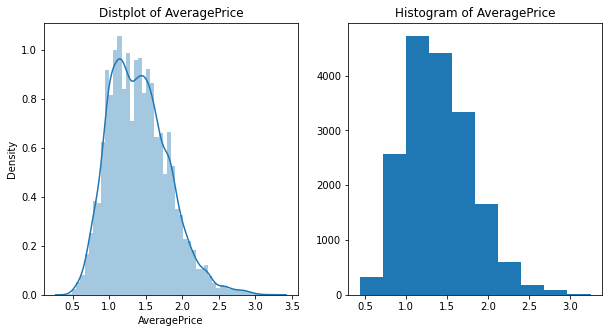

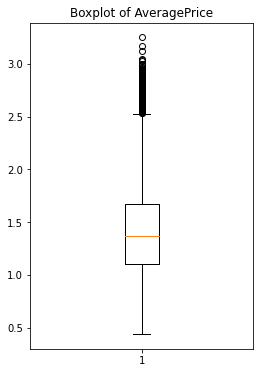


  Number of upper outliers: 193 

  Percentage of ouliers: 0.010775501088716432 
 Descripble of Total Volume : 
count    1.791100e+04
mean     5.392587e+05
std      1.224332e+06
min      8.456000e+01
25%      1.057102e+04
50%      1.001541e+05
75%      4.001767e+05
max      1.127475e+07
Name: Total Volume, dtype: float64

  skew = 3.608709490576718 : Right-skewed Distribution 

  kurtosis = 14.013613268693016 : Leptokurtic distribution. 


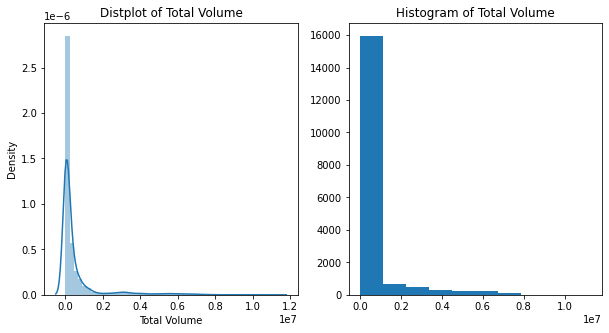

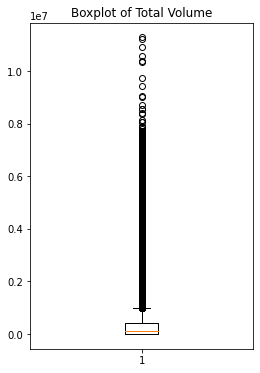


  Number of upper outliers: 2189 

  Percentage of ouliers: 0.12221539835855061 
 Descripble of 4046 : 
count    1.791100e+04
mean     1.838074e+05
std      5.151059e+05
min      0.000000e+00
25%      8.196600e+02
50%      7.824430e+03
75%      1.014888e+05
max      5.160897e+06
Name: 4046, dtype: float64

  skew = 4.423296208870699 : Right-skewed Distribution 

  kurtosis = 21.62853375319494 : Leptokurtic distribution. 


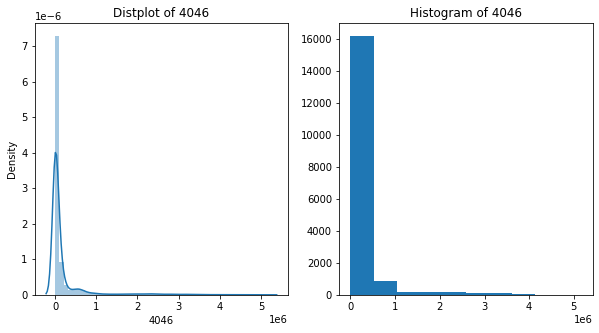

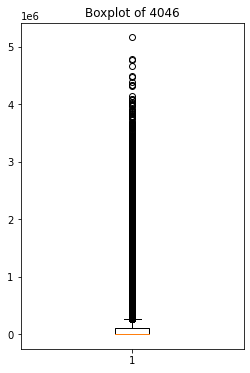


  Number of upper outliers: 2451 

  Percentage of ouliers: 0.13684328066551282 
 Descripble of 4225 : 
count    1.791100e+04
mean     1.882231e+05
std      4.519856e+05
min      0.000000e+00
25%      2.909610e+03
50%      2.670199e+04
75%      1.317552e+05
max      5.402444e+06
Name: 4225, dtype: float64

  skew = 4.127037391547248 : Right-skewed Distribution 

  kurtosis = 20.439007329533915 : Leptokurtic distribution. 


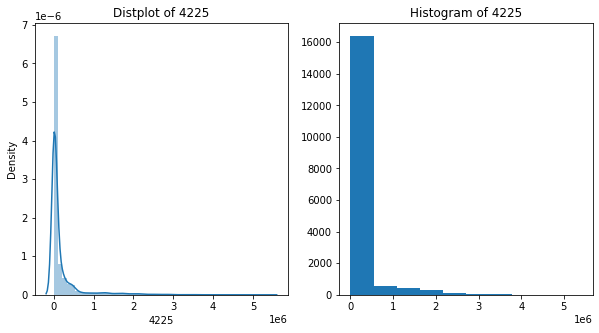

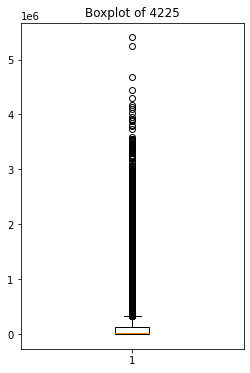


  Number of upper outliers: 2551 

  Percentage of ouliers: 0.14242644185137626 
 Descripble of 4770 : 
count     17911.000000
mean      14551.234381
std       48817.536762
min           0.000000
25%           0.000000
50%         164.230000
75%        5736.735000
max      804558.250000
Name: 4770, dtype: float64

  skew = 6.259900758601457 : Right-skewed Distribution 

  kurtosis = 52.15585027204352 : Leptokurtic distribution. 


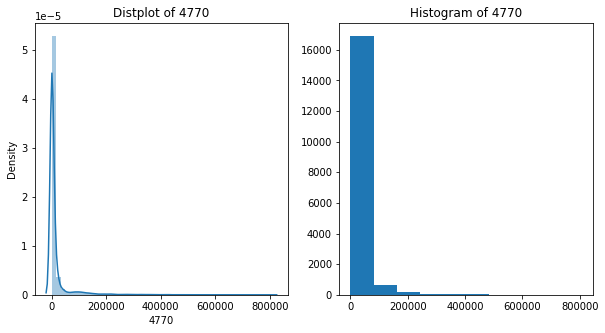

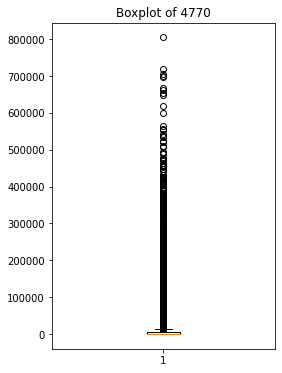


  Number of upper outliers: 2957 

  Percentage of ouliers: 0.1650940762659818 
 Descripble of Total Bags : 
count    1.791100e+04
mean     1.526757e+05
std      3.645992e+05
min      0.000000e+00
25%      4.905195e+03
50%      3.755102e+04
75%      1.036916e+05
max      4.145407e+06
Name: Total Bags, dtype: float64

  skew = 4.497227139654136 : Right-skewed Distribution 

  kurtosis = 24.894332005033256 : Leptokurtic distribution. 


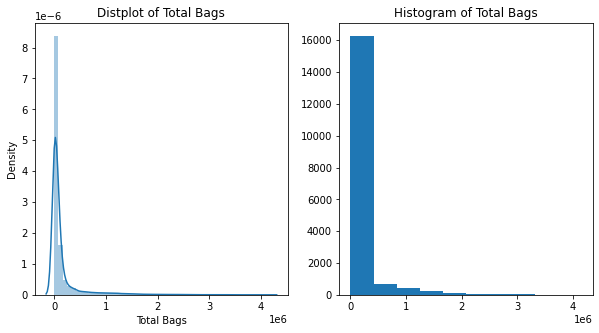

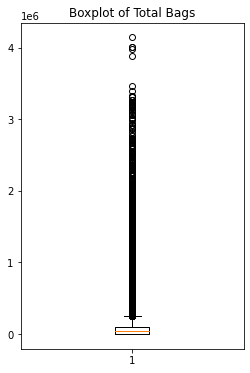


  Number of upper outliers: 2333 

  Percentage of ouliers: 0.13025515046619396 
 Descripble of Small Bags : 
count    1.791100e+04
mean     1.162029e+05
std      2.787596e+05
min      0.000000e+00
25%      2.700335e+03
50%      2.453062e+04
75%      7.928259e+04
max      3.403581e+06
Name: Small Bags, dtype: float64

  skew = 4.284060818895854 : Right-skewed Distribution 

  kurtosis = 22.27186348974206 : Leptokurtic distribution. 


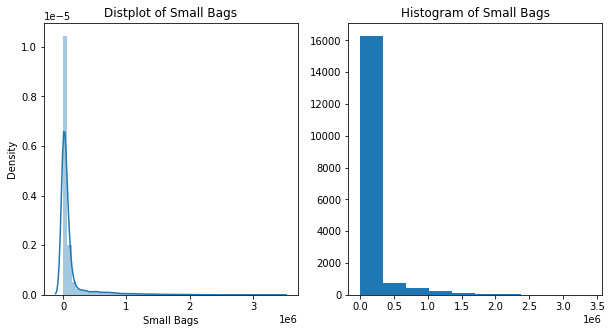

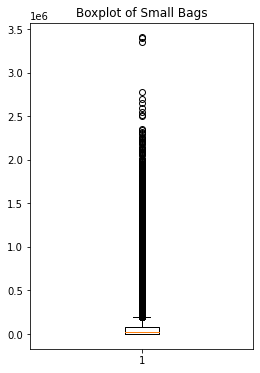


  Number of upper outliers: 2187 

  Percentage of ouliers: 0.12210373513483334 
 Descripble of Large Bags : 
count    1.791100e+04
mean     3.450569e+04
std      1.139477e+05
min      0.000000e+00
25%      1.129950e+02
50%      2.459220e+03
75%      1.942171e+04
max      2.838239e+06
Name: Large Bags, dtype: float64

  skew = 7.916074084050681 : Right-skewed Distribution 

  kurtosis = 90.78197110468106 : Leptokurtic distribution. 


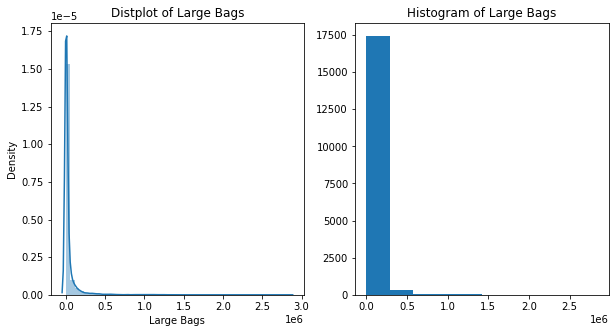

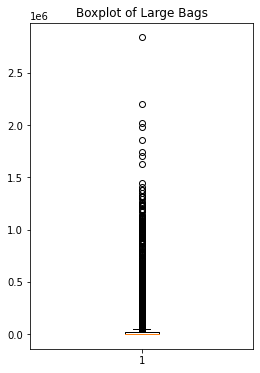


  Number of upper outliers: 2630 

  Percentage of ouliers: 0.14683713918820837 
 Descripble of XLarge Bags : 
count     17911.000000
mean       1967.168041
std        8186.402196
min           0.000000
25%           0.000000
50%           0.000000
75%         106.760000
max      131300.760000
Name: XLarge Bags, dtype: float64

  skew = 6.952878373942855 : Right-skewed Distribution 

  kurtosis = 59.13760880847079 : Leptokurtic distribution. 


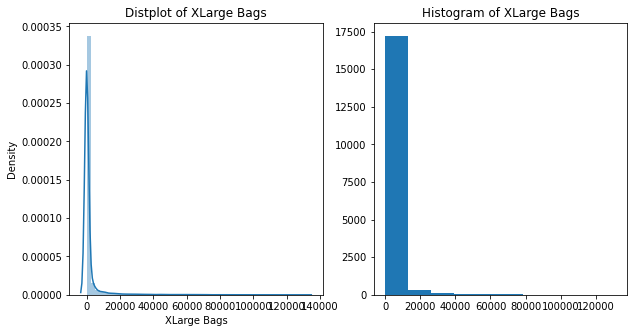

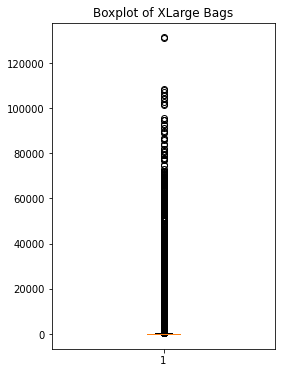


  Number of upper outliers: 3981 

  Percentage of ouliers: 0.2222656468092234 
 Descripble of year : 
count    17911.000000
mean      2016.147898
std          0.939939
min       2015.000000
25%       2015.000000
50%       2016.000000
75%       2017.000000
max       2018.000000
Name: year, dtype: float64

  skew = 0.21534191256981783 : Right-skewed Distribution 

  kurtosis = -1.0327427323400415 : Mesokurtic distribution 


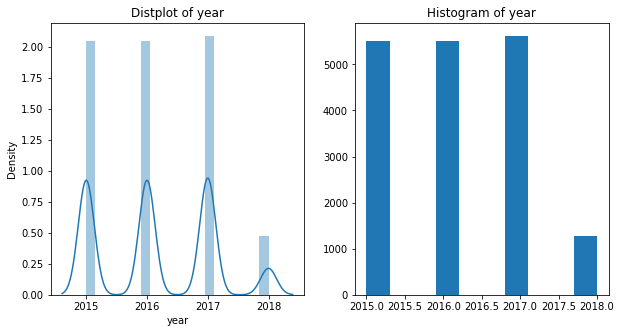

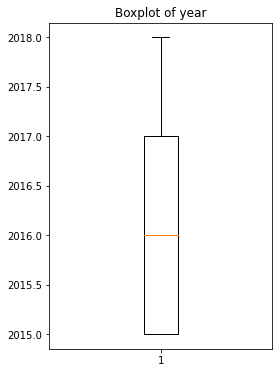

In [28]:
for i in numbers:
    Continuous_variable_analysis(df[i], i)

##### Comments on continuous variable analysis:
 * AveragePrice is left-skewed, with high leptokurtosis distribution showing outliers over 2.5
 * Other variables (except year) are left-skewed and leptokurtic (with very high kurotosis) showing many outliers. In this case, I keep all outliers to have the whole big picture of data
 * Year: compared to the period of 2015 and 2017, data in 2015 is less (based on frequency) because the dataset is updated till Q1.2018


In [29]:
# b. Categorical Variables
def Categorical_variable_analysis(col, name):
    begin_bold = '\x1b[1m'
    end_bold = '\x1b[0m'
    print('\x1b[1;03;31;47m','Count of values by', name,'\x1b[0m')
    print(col.value_counts())
    # Visualization
    # Barplot
    print('\n', begin_bold, 'Barplot for count_values by ', name, end_bold)
    col.value_counts().plot.bar(figsize=(12,6))
    plt.show()

 Count of values by Date 
2015-05-24    106
2017-07-09    106
2015-06-07    106
2018-02-25    106
2015-06-28    106
             ... 
2015-11-29    106
2016-05-22    106
2017-06-18    105
2017-06-25    105
2015-12-06    105
Name: Date, Length: 169, dtype: int64

  Barplot for count_values by  Date 


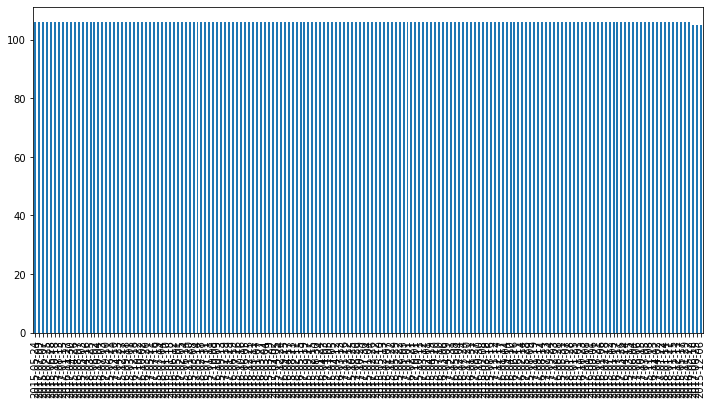

 Count of values by type 
conventional    8957
organic         8954
Name: type, dtype: int64

  Barplot for count_values by  type 


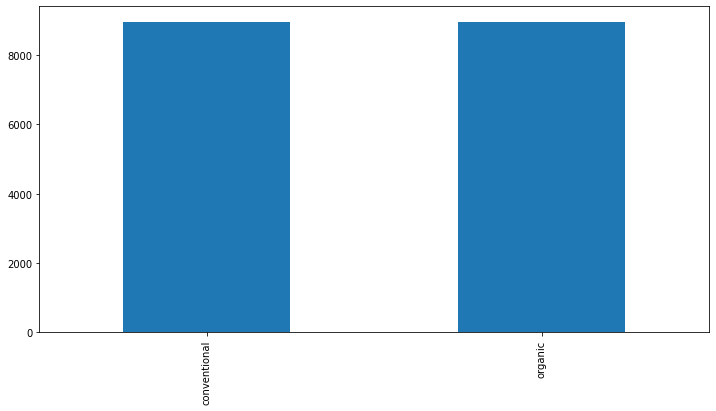

 Count of values by region 
Indianapolis           338
RichmondNorfolk        338
LasVegas               338
NewYork                338
LosAngeles             338
Portland               338
Syracuse               338
NewOrleansMobile       338
StLouis                338
Houston                338
Columbus               338
Philadelphia           338
Midsouth               338
Detroit                338
HartfordSpringfield    338
SouthCentral           338
Sacramento             338
Denver                 338
Chicago                338
Northeast              338
SanFrancisco           338
Roanoke                338
Jacksonville           338
West                   338
NorthernNewEngland     338
RaleighGreensboro      338
California             338
SouthCarolina          338
Pittsburgh             338
GrandRapids            338
Boston                 338
PhoenixTucson          338
Spokane                338
SanDiego               338
Louisville             338
GreatLakes             338


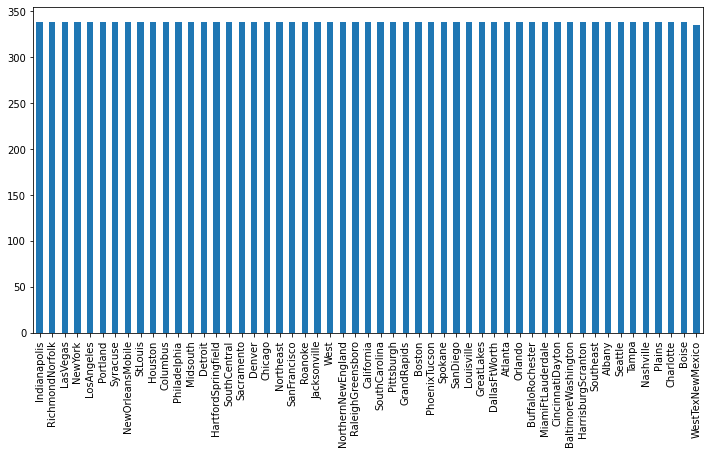

In [30]:
for i in objects:
    Categorical_variable_analysis(df[i],i)

##### Comments on categorical variable analysis:
 * Data size of date, type and region are equal.

#### Bi/Multi-variate Analysis

- Continuous & Continous
- Categorical & Categorical
- Categorical & Continuous

#### a. Continuous & Continuous

In [31]:
corr=df.corr()
corr

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
AveragePrice,1.000000,-0.343982,-0.342105,-0.267643,-0.241213,-0.307685,-0.296151,-0.248909,-0.154424,0.091897
Total Volume,-0.343982,1.000000,0.895002,0.872547,0.649072,0.924980,0.920763,0.668446,0.538396,0.030621
4046,-0.342105,0.895002,1.000000,0.603442,0.509280,0.776373,0.761604,0.589649,0.436249,0.004244
4225,-0.267643,0.872547,0.603442,1.000000,0.623368,0.754345,0.782892,0.466107,0.449903,-0.015449
4770,-0.241213,0.649072,0.509280,0.623368,1.000000,0.553417,0.566304,0.343136,0.587963,-0.050252
Total Bags,-0.307685,0.924980,0.776373,0.754345,0.553417,1.000000,0.969591,0.787834,0.555153,0.122705
Small Bags,-0.296151,0.920763,0.761604,0.782892,0.566304,0.969591,1.000000,0.613817,0.587470,0.108639
Large Bags,-0.248909,0.668446,0.589649,0.466107,0.343136,0.787834,0.613817,1.000000,0.267308,0.118942
XLarge Bags,-0.154424,0.538396,0.436249,0.449903,0.587963,0.555153,0.587470,0.267308,1.000000,0.110051
year,0.091897,0.030621,0.004244,-0.015449,-0.050252,0.122705,0.108639,0.118942,0.110051,1.000000


In [32]:
plt.rcParams["image.cmap"] = "Set1"
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.Set1.colors)

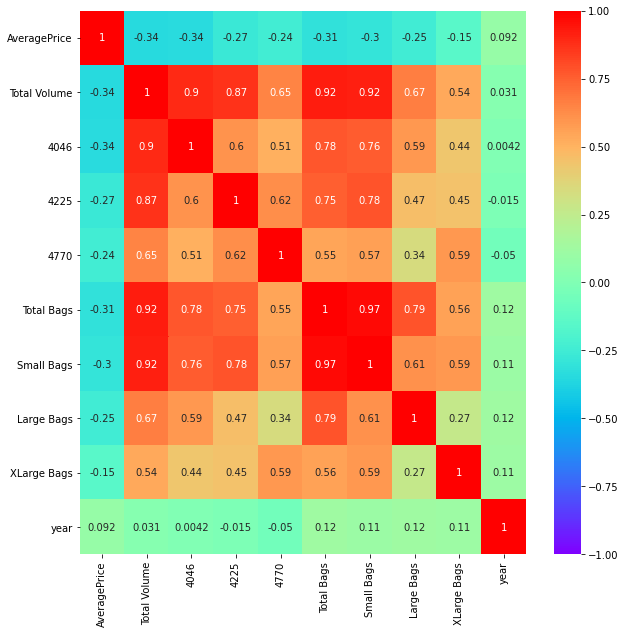

In [33]:
fig, ax= plt.subplots(figsize=(10,10))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='rainbow')
plt.show()

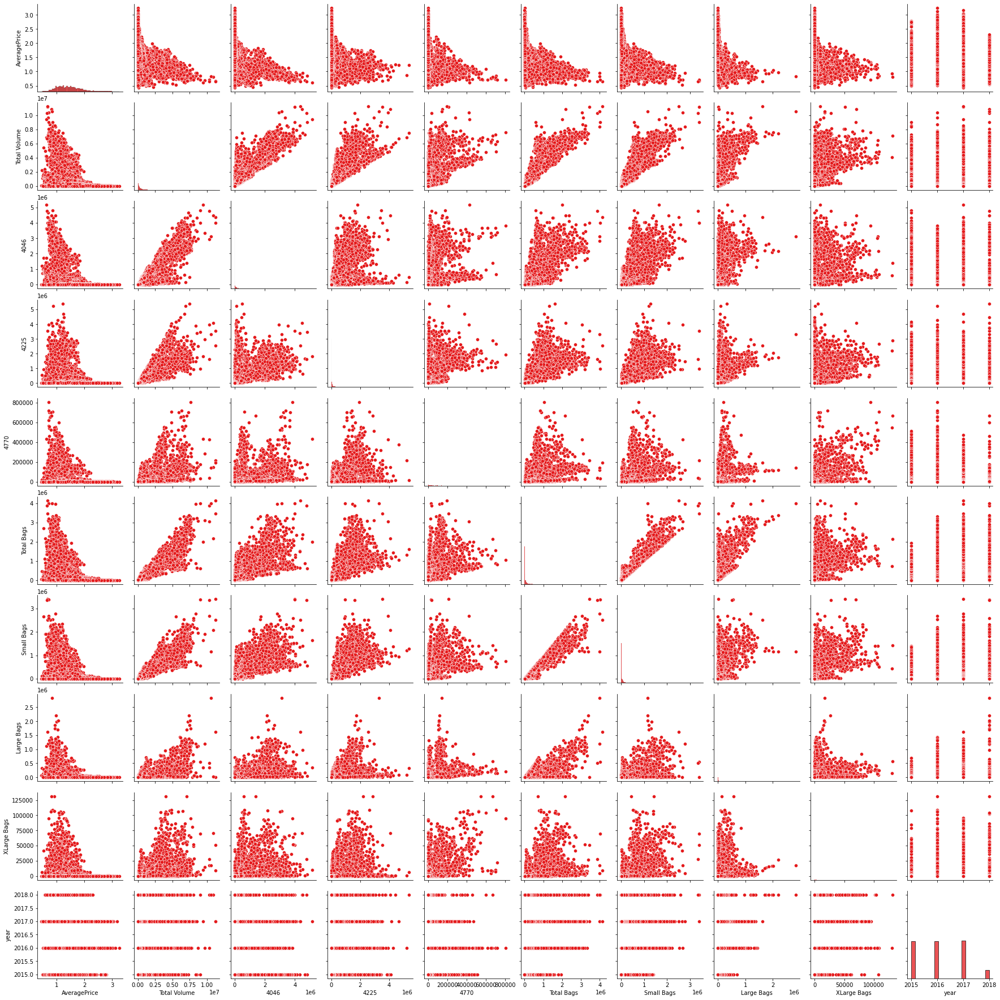

In [34]:
sns.pairplot(df)
plt.show()

##### Comments:
Correlation of AveragePrice and other variables are very low but Correlation of those variables are high. Thus, need to go into some variables before select which avariables would be used for analysis.
Groups/Pairs with high corrlation need to be screened as below: 
 * Total Volume and Total Bags
 * Total Volume and '4046', '4225', '4770'
 * 'Total Bags' and 'Small Bags', 'Large Bags', 'Total Volume'

#### b. Categorical & Categorical

In [35]:
def Categorical_Categorical_analysis(col1, col2):
    table = pd.crosstab(col1, col2)
    print(table)
    table.plot.bar(figsize=(16,8))
    table.plot(kind='bar', stacked=True, figsize=(10,5))
    stat, p, dof, expected = chi2_contingency(table)
    print('\n stat, p, dof: ', stat, p, dof)
    prob = 0.95
    alpha = 1 - prob
    critical = chi2.ppf(prob, dof)
    print('\n critical: ',critical)
    if p<=alpha:
        print("\n Dependent (reject Ho)")
    else:
        print("\n Independent (fail to reject Ho)")

type        conventional  organic
Date                             
2015-01-04            53       53
2015-01-11            53       53
2015-01-18            53       53
2015-01-25            53       53
2015-02-01            53       53
...                  ...      ...
2018-02-25            53       53
2018-03-04            53       53
2018-03-11            53       53
2018-03-18            53       53
2018-03-25            53       53

[169 rows x 2 columns]

 stat, p, dof:  0.02806894485216106 1.0 168

 critical:  199.2441769293174

 Independent (fail to reject Ho)


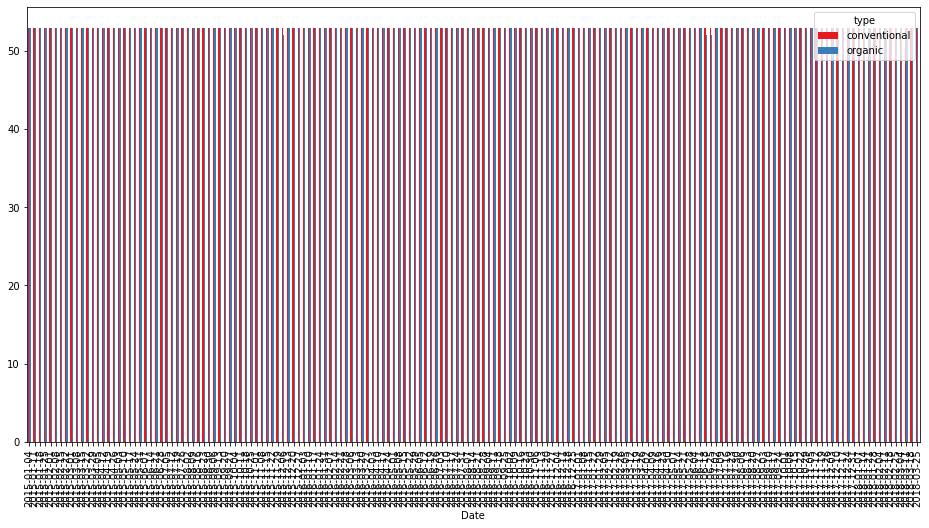

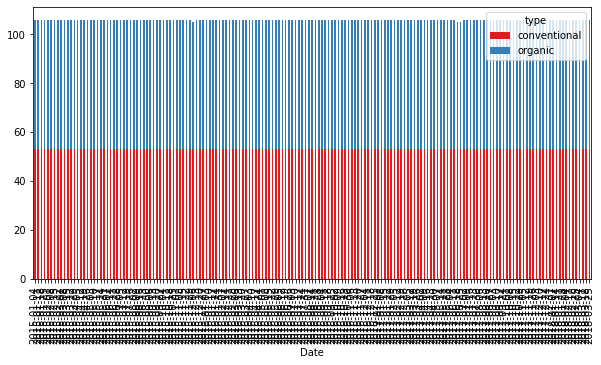

In [24]:
Categorical_Categorical_analysis(df['Date'], df['type'])

##### Comment:
 * Categorical variables are indenpendent

#### c. Categorical & Continuous

- ##### Feature Engineering
 * Spring: March, April, May
 * Summer = June, July, August
 * Autumn = September, Octor, November
 * WIner = December, January, February


In [36]:
def convert_month(month):
    if month == 3 or month == 4 or month ==5:
        return 2
    elif month == 6 or month == 7 or month == 8:
        return 3
    elif month == 9 or month == 10 or month == 11:
        return 4
    else:
        return 1

In [40]:
df['Date']=pd.to_datetime(df['Date'])

In [41]:
df['Month']=pd.DatetimeIndex(df['Date']).month

In [42]:
df['Season']=df['Month'].apply(lambda x: convert_month(x))
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Season
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,1
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,1
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,1
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,1
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,4


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17911 entries, 0 to 11
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          17911 non-null  datetime64[ns]
 1   AveragePrice  17911 non-null  float64       
 2   Total Volume  17911 non-null  float64       
 3   4046          17911 non-null  float64       
 4   4225          17911 non-null  float64       
 5   4770          17911 non-null  float64       
 6   Total Bags    17911 non-null  float64       
 7   Small Bags    17911 non-null  float64       
 8   Large Bags    17911 non-null  float64       
 9   XLarge Bags   17911 non-null  float64       
 10  type          17911 non-null  object        
 11  year          17911 non-null  int64         
 12  region        17911 non-null  object        
 13  Month         17911 non-null  int64         
 14  Season        17911 non-null  int64         
dtypes: datetime64[ns](1), float64(9), int64

In [44]:
#Add Revenue column
df['Revenue']=df['AveragePrice']*df['Total Volume']
df.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Season,Revenue
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,1,85434.7046
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,1,74083.9230
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,1,109944.8046
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,1,85311.5220
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,4,65330.6880


In [48]:
def Categorical_Continuous_analysis(cate_var, cont_var):
    for i in cate_var:
        for j in cont_var:
            table = pd.crosstab(df[i], df[j])
            print ('\n', table)
            df_catecon = df[[i,j]]
            print ('\n',df_catecon.head())
        # Visualization
            plt.figure(figsize=(10,5))
            sns.boxplot(x=i, y=j, data=df_catecon, palette="Set3")
            plt.xticks(rotation=45)
            plt.show()
        # Anova  
            model = ols('{}~{}'.format(j,i), data=df_catecon).fit()  
            anova_table = sm.stats.anova_lm(model, typ=2)
            print('\n',anova_table)
        # Tukey
            #m_comp = pairwise_tukeyhsd(endog=df[j],groups=df[i],alpha=0.05)
            #print('\n',m_comp)

In [49]:
cate = df[['Season','type', 'region']]
cont = df[['AveragePrice']]


 AveragePrice  0.44  0.46  0.48  0.49  0.51  0.52  0.53  0.54  0.55  0.56  ...  \
Season                                                                    ...   
1                0     1     0     2     2     1     4     4     2     6  ...   
2                1     0     1     0     3     1     1     2     1     5  ...   
3                0     0     0     0     0     1     1     1     0     1  ...   
4                0     0     0     0     0     0     0     0     0     0  ...   

AveragePrice  2.96  2.97  2.99  3.00  3.03  3.04  3.05  3.12  3.17  3.25  
Season                                                                    
1                0     0     0     0     0     0     0     0     0     0  
2                0     0     0     0     0     0     1     0     1     0  
3                1     0     0     1     0     1     0     0     0     0  
4                0     1     2     1     1     0     0     1     0     1  

[4 rows x 259 columns]

    Season  AveragePrice
0       1  

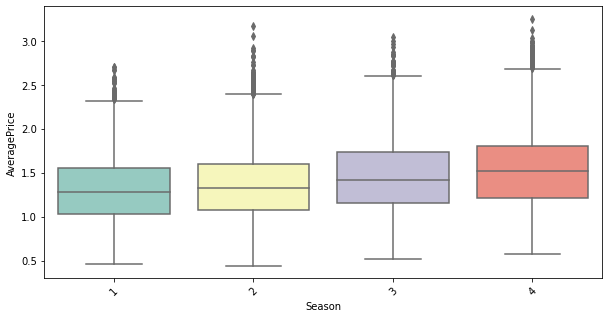


                sum_sq       df           F         PR(>F)
Season     146.027205      1.0  940.437699  2.475645e-201
Residual  2780.834084  17909.0         NaN            NaN

 AveragePrice  0.44  0.46  0.48  0.49  0.51  0.52  0.53  0.54  0.55  0.56  ...  \
type                                                                      ...   
conventional     0     1     0     1     3     2     6     7     3    10  ...   
organic          1     0     1     1     2     1     0     0     0     2  ...   

AveragePrice  2.96  2.97  2.99  3.00  3.03  3.04  3.05  3.12  3.17  3.25  
type                                                                      
conventional     0     0     0     0     0     0     0     0     0     0  
organic          1     1     2     2     1     1     1     1     1     1  

[2 rows x 259 columns]

            type  AveragePrice
0  conventional          1.33
1  conventional          1.35
2  conventional          0.93
3  conventional          1.08
4  conventional      

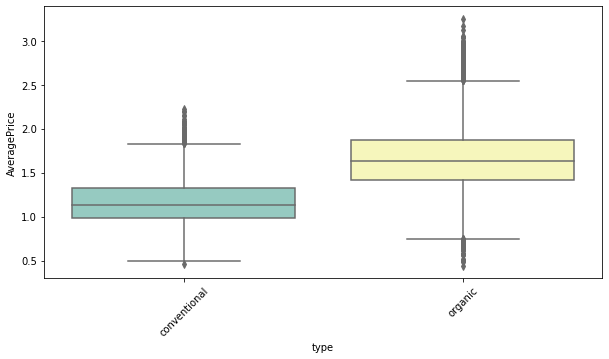


                sum_sq       df             F  PR(>F)
type      1104.936229      1.0  10861.205753     0.0
Residual  1821.925059  17909.0           NaN     NaN

 AveragePrice         0.44  0.46  0.48  0.49  0.51  0.52  0.53  0.54  0.55  \
region                                                                      
Albany                  0     0     0     0     0     0     0     0     0   
Atlanta                 0     0     0     0     0     0     0     0     0   
BaltimoreWashington     0     0     0     0     0     0     0     0     0   
Boise                   0     0     0     0     0     0     0     0     0   
Boston                  0     0     0     0     0     0     0     0     0   
BuffaloRochester        0     0     0     0     0     0     0     0     0   
California              0     0     0     0     0     0     0     0     0   
Charlotte               0     0     0     0     0     0     0     0     0   
Chicago                 0     0     0     0     0     0     0     0

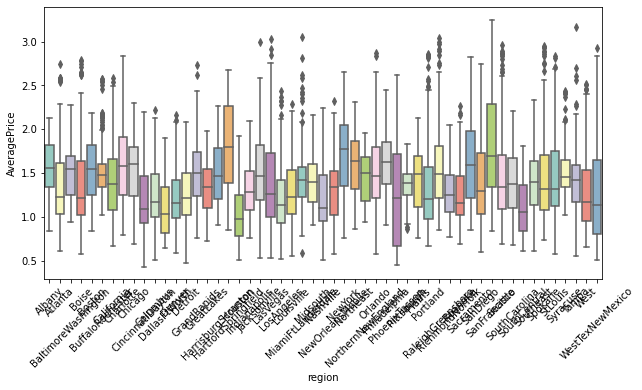


                sum_sq       df          F  PR(>F)
region     494.865883     52.0  69.880216     0.0
Residual  2431.995405  17858.0        NaN     NaN


In [50]:
Categorical_Continuous_analysis(cate, cont)


##### Comment
 * type, region, season are attribute to AveragePrice change (due to very low P-value)
 * AveragePrice of 2 avocado types change by season
 * AveragePrice of organic avocadoes fluctuates more and have more outliers than conventional avocados.

 * #### AveragePrice and Type/Region

In [51]:
model = ols('AveragePrice~C(type):C(region)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(type):C(region),1717.270324,105.0,240.742524,0.0
Residual,1209.590964,17805.0,NaN,NaN


<Figure size 504x1080 with 0 Axes>

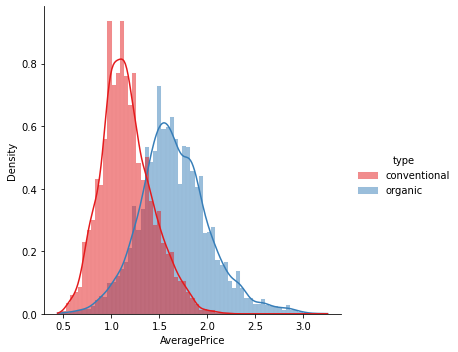

In [52]:
plt.figure(figsize=[7,15])
sns.displot(df, x='AveragePrice', hue='type', stat='density', kde=True, linewidth=0.01)
plt.show()

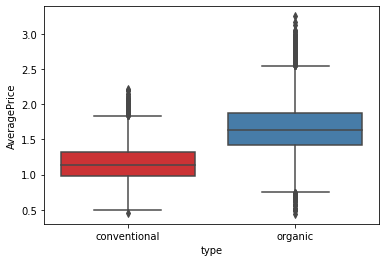

In [53]:
sns.boxplot(data=df, y='AveragePrice', x='type')
plt.show()

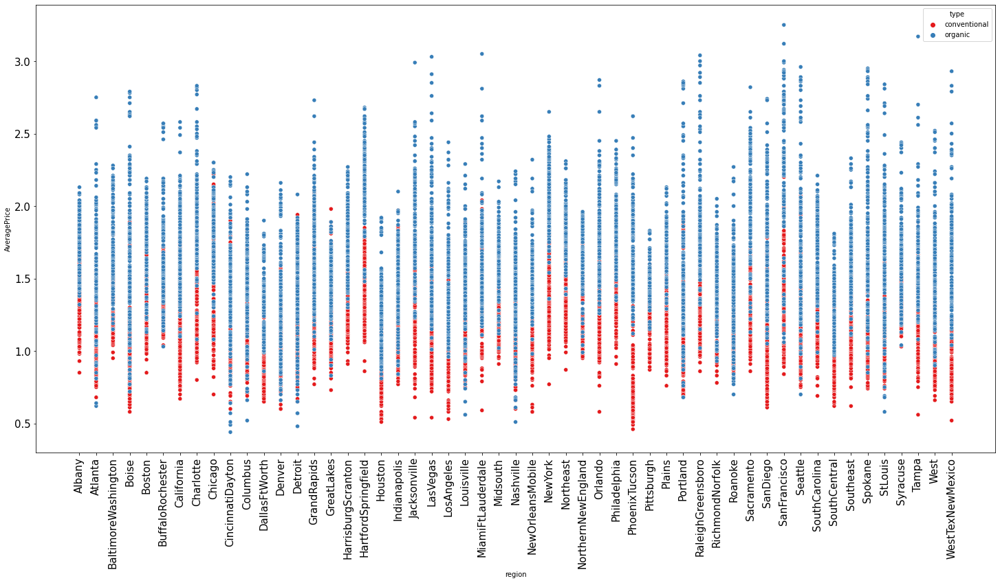

In [54]:
fig, ax= plt.subplots(figsize=(25,12))
#plt.box(False)
sns.scatterplot(x = 'region', y = 'AveragePrice', data = df, hue = 'type', legend = 'full')              
plt.xticks(size= 15, rotation=90)
plt.yticks(size= 15)
plt.show()

#### AveragePrice and time variables (year, Season, Month)

##### Comments: 
 * type and region can explain for AveragePrice change due to low P-value
 * Organic avocados are more expensive than conventional avocado in most cases

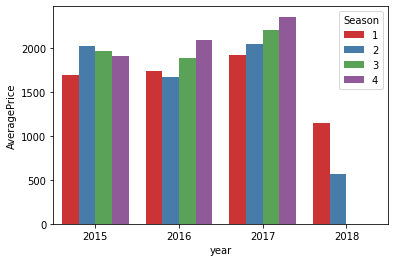

In [55]:
sns.barplot(x="year", y="AveragePrice", hue='Season', data=df.groupby(['year', 'Season'])['AveragePrice'].sum().reset_index())
plt.show()

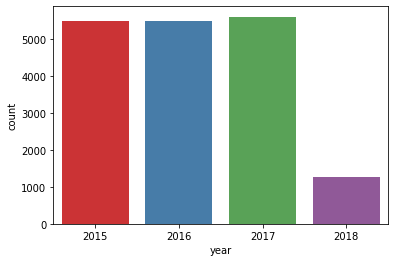

In [56]:
sns.countplot(x = 'year', data = df.sort_values('year'))
plt.show()

##### Comment:
   * Insufficient data for Season 2, 3, 4 of 2018

In [57]:
corr_new=df.corr()
corr_new

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,Month,Season,Revenue
AveragePrice,1.000000,-0.343982,-0.342105,-0.267643,-0.241213,-0.307685,-0.296151,-0.248909,-0.154424,0.091897,0.161463,0.223365,-0.283349
Total Volume,-0.343982,1.000000,0.895002,0.872547,0.649072,0.924980,0.920763,0.668446,0.538396,0.030621,-0.043859,-0.037375,0.970054
4046,-0.342105,0.895002,1.000000,0.603442,0.509280,0.776373,0.761604,0.589649,0.436249,0.004244,-0.039269,-0.029511,0.820301
4225,-0.267643,0.872547,0.603442,1.000000,0.623368,0.754345,0.782892,0.466107,0.449903,-0.015449,-0.037382,-0.032177,0.895239
4770,-0.241213,0.649072,0.509280,0.623368,1.000000,0.553417,0.566304,0.343136,0.587963,-0.050252,-0.046055,-0.029453,0.621987
Total Bags,-0.307685,0.924980,0.776373,0.754345,0.553417,1.000000,0.969591,0.787834,0.555153,0.122705,-0.039293,-0.039980,0.905452
Small Bags,-0.296151,0.920763,0.761604,0.782892,0.566304,0.969591,1.000000,0.613817,0.587470,0.108639,-0.039521,-0.037536,0.908251
Large Bags,-0.248909,0.668446,0.589649,0.466107,0.343136,0.787834,0.613817,1.000000,0.267308,0.118942,-0.027787,-0.035826,0.634457
XLarge Bags,-0.154424,0.538396,0.436249,0.449903,0.587963,0.555153,0.587470,0.267308,1.000000,0.110051,-0.017466,-0.003777,0.567843
year,0.091897,0.030621,0.004244,-0.015449,-0.050252,0.122705,0.108639,0.118942,0.110051,1.000000,-0.177048,-0.159164,0.056398


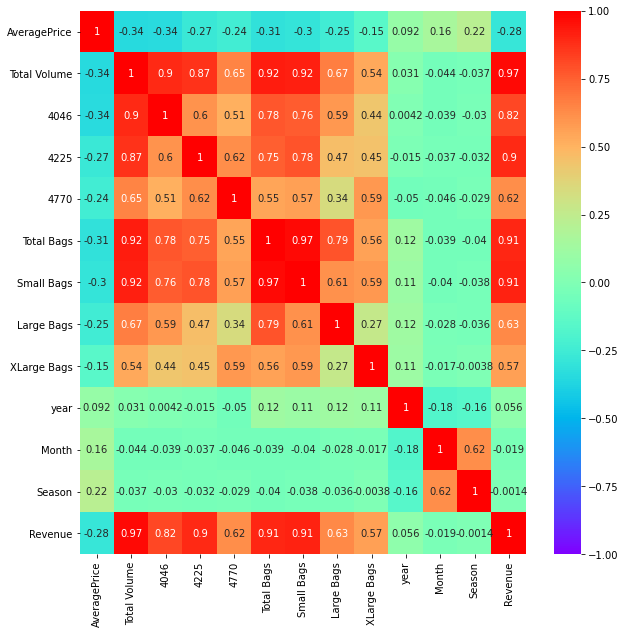

In [58]:
fig, ax= plt.subplots(figsize=(10,10))
sns.heatmap(corr_new, vmin=-1, vmax=1, annot=True, cmap='rainbow')
plt.show()

##### Comment:
* Time variables are slightly positive correlated to AveragePrice.

#### type and Total Bags

In [59]:
df = df.rename(columns={'Total Bags':'Total_Bags', 'Total Volume':'Total_Volume'})


 Total_Bags    0.00        3.09        3.11        3.19        3.33        \
type                                                                       
conventional           0           0           0           0           0   
organic               15           1           1           1           1   

Total_Bags    6.14        6.18        6.24        6.36        7.02        ...  \
type                                                                      ...   
conventional           0           0           0           0           0  ...   
organic                1           1           1           1           1  ...   

Total_Bags    3311551.83  3330284.14  3332107.22  3396032.73  3462625.70  \
type                                                                       
conventional           1           1           1           1           1   
organic                0           0           0           0           0   

Total_Bags    3888117.47  3985722.08  4006894.75  4014132.29  4

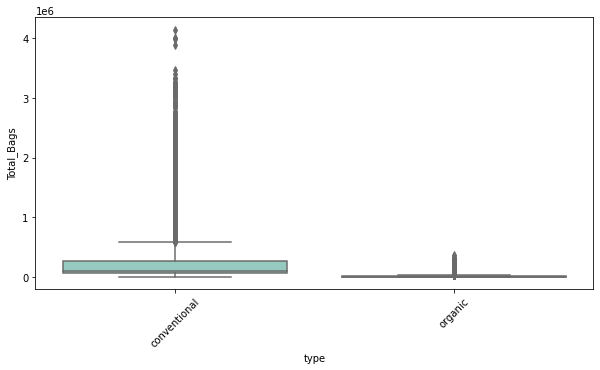


                 sum_sq       df            F  PR(>F)
type      3.357065e+14      1.0  2939.768023     0.0
Residual  2.045116e+15  17909.0          NaN     NaN

 Total_Bags           0.00        3.09        3.11        3.19        \
region                                                                
Albany                        0           0           0           0   
Atlanta                       1           0           0           0   
BaltimoreWashington           0           0           0           0   
Boise                         0           0           0           0   
Boston                        0           0           0           0   
BuffaloRochester              0           0           0           0   
California                    0           0           0           0   
Charlotte                     0           0           0           0   
Chicago                       0           0           0           0   
CincinnatiDayton              0           0           0 

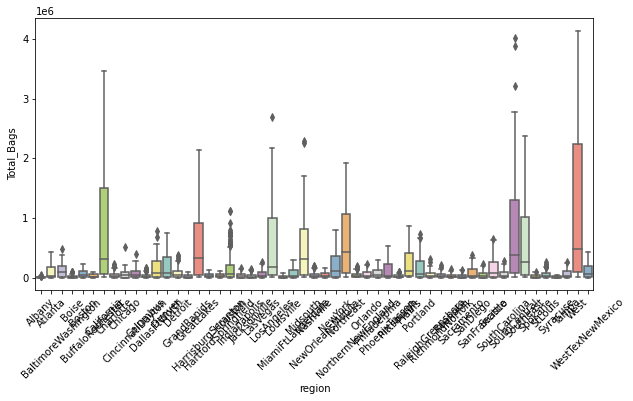


                 sum_sq       df           F  PR(>F)
region    8.924075e+14     52.0  205.905796     0.0
Residual  1.488415e+15  17858.0         NaN     NaN


In [60]:
Categorical_Continuous_analysis(df[['type', 'region']], df[['Total_Bags']])  

In [61]:
model = ols('Total_Bags ~ C(type):C(region)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(type):C(region),1.952198e+15,105.0,772.324129,0.0
Residual,4.286245e+14,17805.0,NaN,NaN


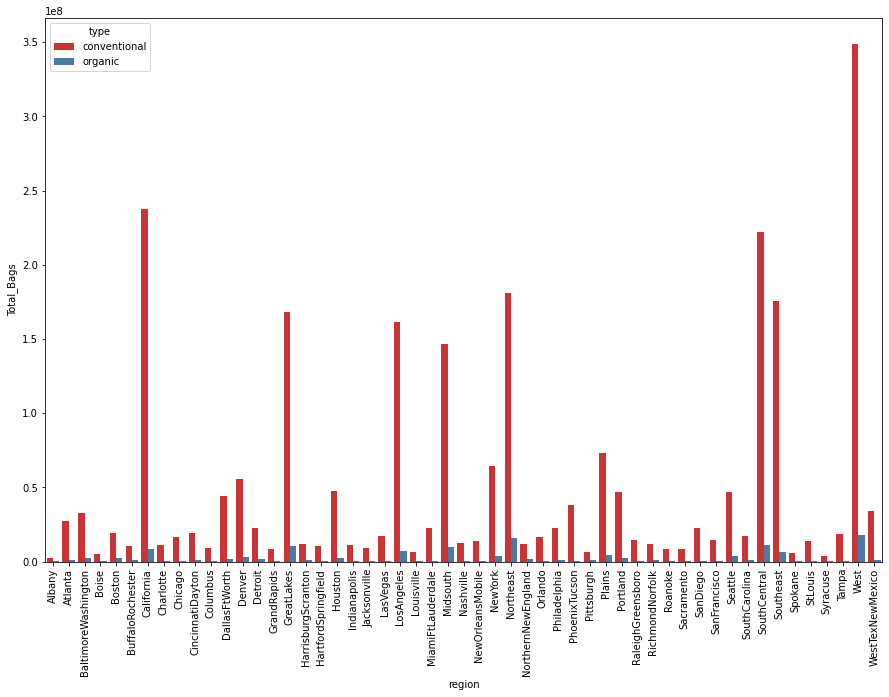

In [45]:
plt.figure(figsize = (15, 10))
sns.barplot(x="region", y="Total_Bags", hue='type', data=df.groupby(["region", 'type'])['Total_Bags'].sum().reset_index())
plt.xticks(rotation = 90)
plt.show()

##### Comments:
 * conventional avocados use more bags than organic avocados
 * the discrepancy of bag usage is significantly large in some regions like West, SouthCentral,...

#### Encoding for  'type' and 'region'

In [62]:
from sklearn.preprocessing import LabelEncoder

In [63]:
df['type'].value_counts()

conventional    8957
organic         8954
Name: type, dtype: int64

In [64]:
df['region'].value_counts()

Indianapolis           338
RichmondNorfolk        338
LasVegas               338
NewYork                338
LosAngeles             338
Portland               338
Syracuse               338
NewOrleansMobile       338
StLouis                338
Houston                338
Columbus               338
Philadelphia           338
Midsouth               338
Detroit                338
HartfordSpringfield    338
SouthCentral           338
Sacramento             338
Denver                 338
Chicago                338
Northeast              338
SanFrancisco           338
Roanoke                338
Jacksonville           338
West                   338
NorthernNewEngland     338
RaleighGreensboro      338
California             338
SouthCarolina          338
Pittsburgh             338
GrandRapids            338
Boston                 338
PhoenixTucson          338
Spokane                338
SanDiego               338
Louisville             338
GreatLakes             338
DallasFtWorth          338
A

In [65]:
le=LabelEncoder()
df['type_new']=le.fit_transform(df['type'])
df.head()

,Date,AveragePrice,Total_Volume,4046,4225,4770,Total_Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Season,Revenue,type_new
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,1,85434.7046,0
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,1,74083.9230,0
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,1,109944.8046,0
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,1,85311.5220,0
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,4,65330.6880,0


In [66]:
df.groupby(['type', 'type_new'])['type_new'].count()

type          type_new
conventional  0           8957
organic       1           8954
Name: type_new, dtype: int64

In [67]:
df1=df

In [68]:
df1['region1'] = le.fit_transform(df1['region'])

In [69]:
df1.head()

,Date,AveragePrice,Total_Volume,4046,4225,4770,Total_Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Season,Revenue,type_new,region1
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12,1,85434.7046,0,0
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12,1,74083.9230,0,0
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12,1,109944.8046,0,0
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12,1,85311.5220,0,0
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11,4,65330.6880,0,0


In [70]:
df1.groupby(['region', 'region1'])['region1'].count()

region               region1
Albany               0          338
Atlanta              1          338
BaltimoreWashington  2          338
Boise                3          338
Boston               4          338
BuffaloRochester     5          338
California           6          338
Charlotte            7          338
Chicago              8          338
CincinnatiDayton     9          338
Columbus             10         338
DallasFtWorth        11         338
Denver               12         338
Detroit              13         338
GrandRapids          14         338
GreatLakes           15         338
HarrisburgScranton   16         338
HartfordSpringfield  17         338
Houston              18         338
Indianapolis         19         338
Jacksonville         20         338
LasVegas             21         338
LosAngeles           22         338
Louisville           23         338
MiamiFtLauderdale    24         338
Midsouth             25         338
Nashville            26         338

### Model selection and deployment

#### USA’s Avocado AveragePrice Prediction

In [71]:
df2 = df1.drop(['Date', 'region', 'type'], axis = 1)

In [72]:
y = df2['AveragePrice']
X = df2.drop('AveragePrice', axis = 1)

In [73]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.model_selection import cross_val_score

In [74]:
models = [LinearRegression(), RandomForestRegressor(n_estimators=100)]

In [75]:
CV = 5
#cv_df = pd.DataFrame(index=range(CV * len(models)))
entries = []
i=0


for model in models:
  scorestrain = []
  scorestest = []
  times = []
  abss = []
  for j in range(CV):
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.35, random_state = 25)
    
    t1 = datetime.datetime.now()
    model_name = model.__class__.__name__
    model.fit(Xtrain, ytrain)
    t2 = datetime.datetime.now()
    time = round((t2 - t1).microseconds/1000, 1)
    score_train = model.score(Xtrain, ytrain)
    score_test = model.score(Xtest, ytest)
    abs_score = abs(score_train - score_test)
    
    scorestrain.append(score_train)
    scorestest.append(score_test)
    times.append(time)

  print(model.__class__.__name__, scorestest)
  entries.append([model_name, np.array(scorestrain).mean(),
                   np.array(scorestest).mean(), np.array(abs_score).mean(),
                   np.array(times).mean()])
cv_df = pd.DataFrame(entries, columns = ['model_name', 'score train mean',
                                         'score test mean', 'abs score mean',
                                         'time_mean'])
cv_df

LinearRegression [0.5061998108790027, 0.5061998108790027, 0.5061998108790027, 0.5061998108790027, 0.5061998108790027]
RandomForestRegressor [0.9167202010660401, 0.9181050187289919, 0.9163135151652022, 0.9168717120207276, 0.9174209721259611]


,model_name,score train mean,score test mean,abs score mean,time_mean
0,LinearRegression,0.500499,0.506200,0.005701,7.92
1,RandomForestRegressor,0.987700,0.917086,0.070296,262.42


In [76]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor

from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from sklearn.metrics import r2_score


xg = XGBRegressor(n_estimators = 800, max_depth = 10)

In [77]:
t1 = datetime.datetime.now()
xg = XGBRegressor(n_estimators = 800, max_depth = 10)

In [78]:
y1 = df2['AveragePrice'].values
X1 = df2.drop('AveragePrice', axis = 1).values
Xtrain, Xtest, ytrain, ytest = train_test_split(X1, y1, test_size = 0.3, random_state = 25)

In [79]:
xg.fit(Xtrain, ytrain)
y_pred = xg.predict(Xtest)

In [80]:
mse_xgb = mean_squared_error(y_pred, ytest)
mae_xgb = mean_absolute_error(y_pred, ytest)
print(mse_xgb, mae_xgb)

0.00904103910687527 0.06724628808687377


In [81]:
xg_score = r2_score(ytest, y_pred)
t2 = datetime.datetime.now() - t1
print('Score: {score}\nTime:{t2}'.format(score = xg_score, t2 = t2))

Score: 0.9433800566390419
Time:0:00:06.083037


#### Comments :
 * 3 models show the relatively low difference of train/predict and test means (abs score mean, mse, msa under 0.08)
 * Linear Regression: give the least accurate result though quick process time
 * Random forest: give higher accurate result (>90% for both train and test dataset) but the processing time is more than 3 minutes
 * XGB can processed faster with high accuracy, 94%

 

#### Application of Lazy Regressor to find more effective models

In [84]:
### Importing LazyRegressor
from lazypredict.Supervised import LazyRegressor
### Importing dataset available in sklearn
from sklearn import datasets
from sklearn.utils import shuffle

In [85]:
y2 = df2['AveragePrice'].values
X2 = df2.drop('AveragePrice', axis = 1).values
Xtrain, Xtest, ytrain, ytest = train_test_split(X2, y2, test_size = 0.3, random_state = 25)

In [86]:
reg = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)

In [87]:
### fitting data in LazyClassifier
models, predictions = reg.fit(Xtrain, Xtest, ytrain, ytest)
### lets check which model did better on Dataset
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [02:47<00:00,  3.98s/it]

                               Adjusted R-Squared       R-Squared      RMSE  \
Model                                                                         
XGBRegressor                                 0.96            0.96      0.08   
LGBMRegressor                                0.94            0.94      0.10   
HistGradientBoostingRegressor                0.94            0.94      0.10   
ExtraTreesRegressor                          0.93            0.93      0.11   
RandomForestRegressor                        0.92            0.92      0.12   
BaggingRegressor                             0.90            0.90      0.13   
GradientBoostingRegressor                    0.81            0.81      0.17   
DecisionTreeRegressor                        0.80            0.80      0.18   
MLPRegressor                                 0.78            0.78      0.19   
ExtraTreeRegressor                           0.77            0.77      0.19   
KNeighborsRegressor                          0.74   

##### Comment: Lazy Regressor show the calculation based on 42 algorithm models. The optimal is still GXB with high R squared and low RMSE

In [88]:
from scipy.stats.stats import pearsonr
pearsonr(y_pred, ytest)

(0.9713454640352237, 0.0)

In [89]:
xg.fit(Xtrain, ytrain)

yhat_train = xg.predict(Xtrain)
yhat_test = xg.predict(Xtest)


In [90]:
yhat_train[:5]

array([1.5097322, 1.4403247, 1.1142231, 1.521877 , 1.5696557],
      dtype=float32)

In [91]:
yhat_test[:5]

array([1.6504436, 1.1984781, 1.7862878, 1.2500937, 1.9840722],
      dtype=float32)

In [92]:
df2['AveragePrice'].mean()

1.407619340070348

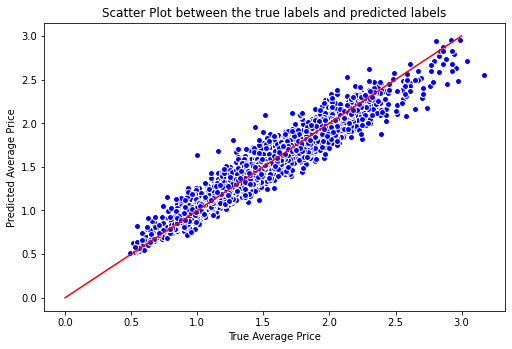

In [95]:
fig = plt.figure(figsize = (8, 5))
axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])
sns.scatterplot(ytest, y_pred, linewidth = 1, ax = axes, color = 'b')
plt.plot([0, 3], [0, 3], color = 'r')
plt.title('Scatter Plot between the true labels and predicted labels')
axes.set_xlabel("True Average Price")
axes.set_ylabel("Predicted Average Price")
plt.show()

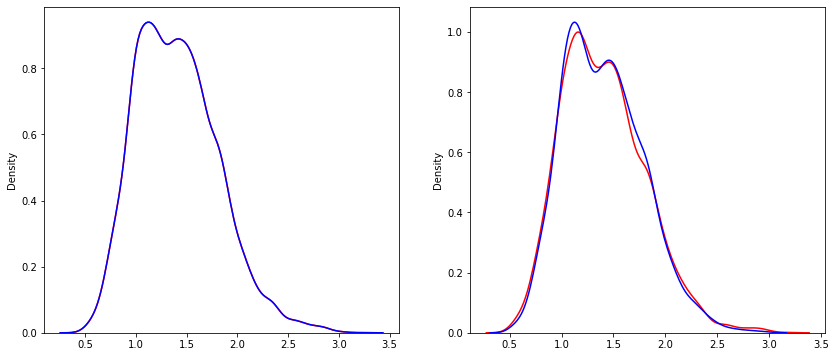

In [94]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
ax1 = sns.distplot(ytrain, hist=False, color="r", label="Actual Train Values")
sns.distplot(xg.predict(Xtrain), hist=False, color="b", label="Predicted Train Values", ax=ax1)
plt.subplot(1,2,2)
ax2 = sns.distplot(ytest, hist=False, color="r", label="Actual Test Values")
sns.distplot(xg.predict(Xtest), hist=False, color="b", label="Predicted Test Values", ax=ax2)
plt.show()

#### Conclusion: GXB gives high accuracy in price prediction and the difference between predicted price and actual price acceptable.

### Time Series Model Deployment for Price Prediction of Organic Avocado in California

In [179]:
# The price forecast of Organic Avocado will be used to evaluate the posibility of expansion in the market.

In [96]:
from pmdarima import auto_arima

In [98]:
df2_ts=df1.groupby(['Date', 'region', 'type']).agg({'Revenue':'sum', 'Total_Volume':'sum'}).reset_index()
df2_ts['AveragePrice_new']=df2_ts['Revenue']/df2_ts['Total_Volume']

#### Note: AveragePrice can be calculated by some different ways

In [99]:
df2_ts

,Date,region,type,Revenue,Total_Volume,AveragePrice_new
0,2015-01-04,Albany,conventional,49865.40,40873.28,1.22
1,2015-01-04,Albany,organic,2459.37,1373.95,1.79
2,2015-01-04,Atlanta,conventional,435021.49,435021.49,1.00
3,2015-01-04,Atlanta,organic,6770.17,3846.69,1.76
4,2015-01-04,BaltimoreWashington,conventional,851067.06,788025.06,1.08
...,...,...,...,...,...,...
17906,2018-03-25,Tampa,organic,14140.17,10028.49,1.41
17907,2018-03-25,West,conventional,7130369.95,7667064.46,0.93
17908,2018-03-25,West,organic,434756.93,271723.08,1.60
17909,2018-03-25,WestTexNewMexico,conventional,810755.45,965185.06,0.84


In [100]:
df3=df2_ts.loc[(df2_ts['region']=='California') & (df2_ts['type']=='organic')].sort_values('Date')
df3

,Date,region,type,Revenue,Total_Volume,AveragePrice_new
13,2015-01-04,California,organic,176513.71,142349.77,1.24
119,2015-01-11,California,organic,173921.75,158110.68,1.10
225,2015-01-18,California,organic,242057.42,195207.60,1.24
331,2015-01-25,California,organic,158207.43,121698.02,1.30
437,2015-02-01,California,organic,217595.41,196031.90,1.11
...,...,...,...,...,...,...
17394,2018-02-25,California,organic,325855.93,179041.72,1.82
17500,2018-03-04,California,organic,375443.00,239135.67,1.57
17606,2018-03-11,California,organic,374180.31,236822.98,1.58
17712,2018-03-18,California,organic,354883.79,202790.74,1.75


In [101]:
df3.tail()

,Date,region,type,Revenue,Total_Volume,AveragePrice_new
17394,2018-02-25,California,organic,325855.93,179041.72,1.82
17500,2018-03-04,California,organic,375443.00,239135.67,1.57
17606,2018-03-11,California,organic,374180.31,236822.98,1.58
17712,2018-03-18,California,organic,354883.79,202790.74,1.75
17818,2018-03-25,California,organic,323437.55,190257.38,1.70


In [102]:
df3['Revenue_0000']=df3['Revenue']/10000
df3.head()

,Date,region,type,Revenue,Total_Volume,AveragePrice_new,Revenue_0000
13,2015-01-04,California,organic,176513.71,142349.77,1.24,17.65
119,2015-01-11,California,organic,173921.75,158110.68,1.10,17.39
225,2015-01-18,California,organic,242057.42,195207.60,1.24,24.21
331,2015-01-25,California,organic,158207.43,121698.02,1.30,15.82
437,2015-02-01,California,organic,217595.41,196031.90,1.11,21.76


In [103]:
# Define a function called plot_timeseries
def plot_timeseries(axes, x, y, color, xlabel, ylabel):
  
  # Plot the inputs x,y in the provided color
  axes.plot(x, y, color=color)

  # Set the x-axis label
  axes.set_xlabel(xlabel)

  # Set the y-axis label
  axes.set_ylabel(ylabel, color=color)

  # Set the colors tick params for y-axis
  axes.tick_params('y', colors=color)

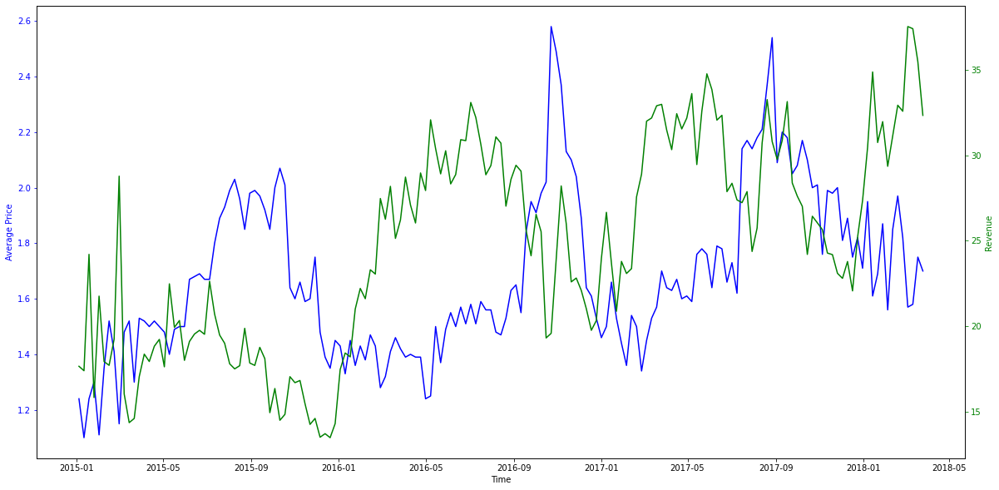

In [178]:
fig, ax = plt.subplots(figsize=(20,10))
plot_timeseries(ax, df3['Date'], df3['AveragePrice_new'], "blue", "Time", "Average Price")
ax2 = ax.twinx()
plot_timeseries(ax2, df3['Date'], df3['Revenue_0000'],"green", "Time", "Revenue")
plt.show()

#### Comments:
 * Seasonal variation is account for AveragePrice and Revenue change
 * In short term, AveragePrice and Revenue show same trend: January - June
 * In short term, AveragePrice and Revenue show opposite trend: June - January
 * In long term, AveragePrice and Revenue show the positive growth.

#### Seasonal Decomposition

In [186]:
arm_df=df3[['Date', 'AveragePrice_new']].set_index('Date')
arm_df.head()

,AveragePrice_new
Date,
2015-01-04,1.24
2015-01-11,1.10
2015-01-18,1.24
2015-01-25,1.30
2015-02-01,1.11


In [187]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(x = arm_df, model='multiplicative')
result

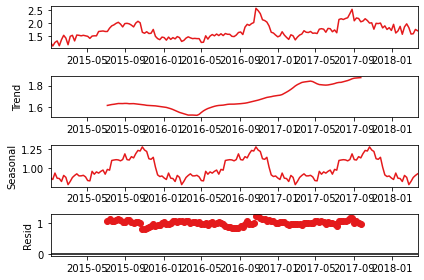

In [188]:
result.plot()
plt.show()

#### Comments: 
After data decomposition of AveragePrice, we can see
* Combined trend: upward (although suffer a slight decrease in 2016)
* Seasonal component:  the quarter of the year
* Cycle: a year

In [189]:
### Try on revenue

arm_df_rev=df3[['Date', 'Revenue']].set_index('Date')
arm_df_rev.head()

,Revenue
Date,
2015-01-04,176513.71
2015-01-11,173921.75
2015-01-18,242057.42
2015-01-25,158207.43
2015-02-01,217595.41


In [190]:
result_rev = seasonal_decompose(x = arm_df_rev, model='multiplicative')
result_rev

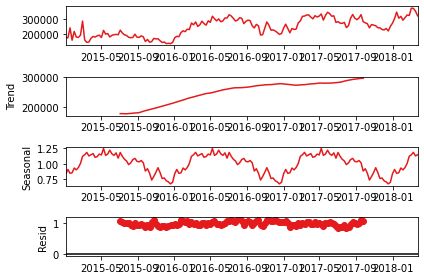

In [191]:
result_rev.plot()
plt.show()

#### Comments: 
After data decomposition of AveragePrice, we can see
* Combined trend: upward (although suffer a slight decrease in 2016)
* Seasonal component:  the quarter of the year but not similar to seasonal component of AveragePrice (probably due to consumption volume)
* Cycle: a year

In [534]:
model_results = {}

### Arima

In [230]:
stepwise_model=auto_arima(arm_df['AveragePrice_new'], start_p=2,start_q=1, 
                          max_p=10, max_q=10,m=52,
                          start_P=1, seasonal=True,
                          d=1, D=1, trace=True,
                          error_action='ignore',
                          suppress_warnings=True,
                          stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,1)(1,1,1)[52]             : AIC=inf, Time=28.83 sec
 ARIMA(0,1,0)(0,1,0)[52]             : AIC=-50.107, Time=0.44 sec
 ARIMA(1,1,0)(1,1,0)[52]             : AIC=inf, Time=5.51 sec
 ARIMA(0,1,1)(0,1,1)[52]             : AIC=inf, Time=4.52 sec
 ARIMA(0,1,0)(1,1,0)[52]             : AIC=-71.497, Time=4.24 sec
 ARIMA(0,1,0)(2,1,0)[52]             : AIC=inf, Time=18.53 sec
 ARIMA(0,1,0)(1,1,1)[52]             : AIC=inf, Time=20.16 sec
 ARIMA(0,1,0)(0,1,1)[52]             : AIC=-63.984, Time=3.53 sec
 ARIMA(0,1,0)(2,1,1)[52]             : AIC=-71.242, Time=19.36 sec
 ARIMA(0,1,1)(1,1,0)[52]             : AIC=-80.600, Time=4.57 sec
 ARIMA(0,1,1)(0,1,0)[52]             : AIC=-52.418, Time=0.67 sec
 ARIMA(0,1,1)(2,1,0)[52]             : AIC=-81.371, Time=24.90 sec
 ARIMA(0,1,1)(2,1,1)[52]             : AIC=-79.371, Time=38.66 sec
 ARIMA(0,1,1)(1,1,1)[52]             : AIC=inf, Time=25.16 sec
 ARIMA(1,1,1)(2,1,0)[52]             : AIC=-80.136

In [231]:
print(stepwise_model.aic())

-81.37112749386105


In [233]:
arm_train=arm_df.iloc[:-52]
arm_test=arm_df.iloc[-52:]

In [234]:
arm_train.head()

,AveragePrice_new
Date,
2015-01-04,1.24
2015-01-11,1.10
2015-01-18,1.24
2015-01-25,1.30
2015-02-01,1.11


In [235]:
arm_train.tail()

,AveragePrice_new
Date,
2017-02-26,1.34
2017-03-05,1.45
2017-03-12,1.53
2017-03-19,1.57
2017-03-26,1.70


In [236]:
arm_test.head()

,AveragePrice_new
Date,
2017-04-02,1.64
2017-04-09,1.63
2017-04-16,1.67
2017-04-23,1.60
2017-04-30,1.61


In [237]:
arm_test.tail()

,AveragePrice_new
Date,
2018-02-25,1.82
2018-03-04,1.57
2018-03-11,1.58
2018-03-18,1.75
2018-03-25,1.70


In [238]:
len(arm_test)

52

In [239]:
len(arm_train)

117

In [240]:
stepwise_model.fit(arm_train)

ARIMA(order=(0, 1, 1), scoring_args={}, seasonal_order=(2, 1, 0, 52),
      suppress_warnings=True, with_intercept=False)

In [462]:
future_forecast = stepwise_model.predict(n_periods=len(arm_test))


In [463]:
future_forecast

array([1.67455968, 1.66824061, 1.67455968, 1.6636803 , 1.58439628,
       1.54543906, 1.70840401, 1.65455968, 1.70928339, 1.82911999,
       1.81175814, 1.84911999, 1.81087876, 1.84280092, 1.88159474,
       1.96703443, 1.97511227, 2.00775042, 1.99302671, 1.95038856,
       1.91791381, 2.03423289, 2.0487932 , 1.99231072, 2.09736123,
       2.10944679, 2.17280092, 2.24280092, 2.22840401, 2.28251274,
       2.21971119, 2.19762563, 2.05010038, 2.04185914, 2.09609266,
       1.88081636, 1.71785142, 1.68241173, 1.70032617, 1.65752456,
       1.62136937, 1.75961061, 1.65136865, 1.64840444, 1.58472223,
       1.71576488, 1.67576517, 1.5212053 , 1.5931264 , 1.67856628,
       1.72400708, 1.76153159])

In [464]:
future_forecast = pd.DataFrame(future_forecast, index = arm_test.index, columns=['Prediction'])

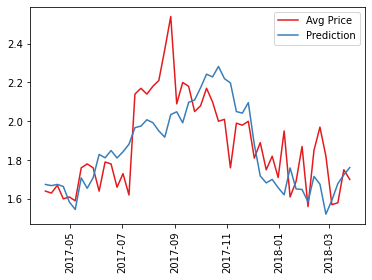

In [465]:
plt.plot(arm_test, label='Avg Price')
plt.plot(future_forecast,label='Prediction')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()

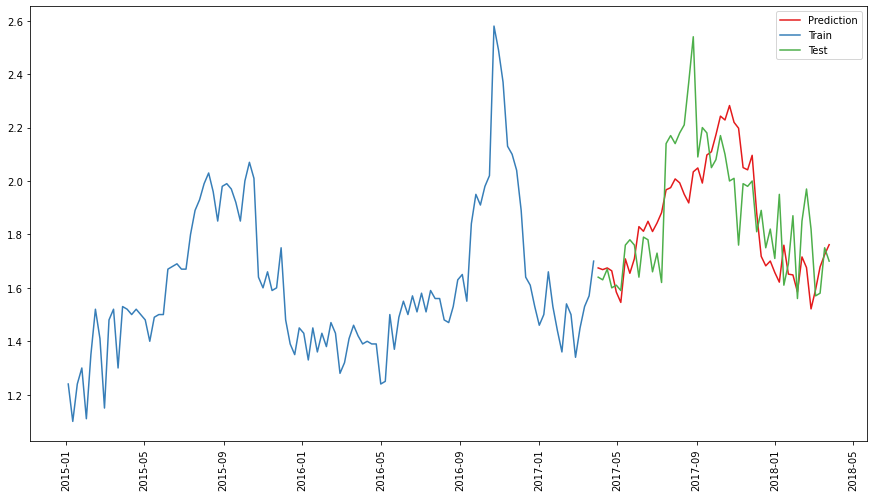

In [466]:
plt.figure(figsize = (15, 8))
plt.plot(future_forecast, label = 'Prediction')
plt.plot(arm_train, label = 'Train')
plt.plot(arm_test, label = 'Test')
plt.xticks(rotation = 'vertical')
plt.legend()
plt.show()

In [537]:
mae = mean_absolute_error(arm_test, future_forecast[0:len(arm_test)])
rmse = sqrt(mean_squared_error(arm_test, future_forecast[0:len(arm_test)]))
model_results['ARIMA'] = {'mae': mae, 'rmse': rmse}
print(f'ARIMA mae: {mae:.2f}, rmse: {rmse:.2f}')

ARIMA mae: 0.14, rmse: 0.18


##### Nhận xét:
Although the model shows low MAE and RMSE, predicted data does not fit the test data set 

In [538]:
print('Mean all data: ',  arm_df['AveragePrice_new'].mean(), '. mae ~', mae/arm_df['AveragePrice_new'].mean()*100, '%, and ', 'mse ~', mse/arm_df['AveragePrice_new'].mean()*100, '% of mean')


Mean all data:  1.6852071005917157 . mae ~ 8.175250871095088 %, and  mse ~ 1.9254103066615513 % of mean


In [539]:
print('Mean test data: ',  arm_test['AveragePrice_new'].mean(), '. mae ~', mae/arm_test['AveragePrice_new'].mean()*100, '%, and ', 'mse ~', mse/arm_test['AveragePrice_new'].mean()*100, '% of mean test')


Mean test data:  1.8753846153846152 . mae ~ 7.34622151854572 %, and  mse ~ 1.7301598262674633 % of mean test


#### One year forecast

In [540]:
future_forecast_1=stepwise_model.predict(n_periods=len(arm_test)+52)
future_forecast_1

array([1.67455968, 1.66824061, 1.67455968, 1.6636803 , 1.58439628,
       1.54543906, 1.70840401, 1.65455968, 1.70928339, 1.82911999,
       1.81175814, 1.84911999, 1.81087876, 1.84280092, 1.88159474,
       1.96703443, 1.97511227, 2.00775042, 1.99302671, 1.95038856,
       1.91791381, 2.03423289, 2.0487932 , 1.99231072, 2.09736123,
       2.10944679, 2.17280092, 2.24280092, 2.22840401, 2.28251274,
       2.21971119, 2.19762563, 2.05010038, 2.04185914, 2.09609266,
       1.88081636, 1.71785142, 1.68241173, 1.70032617, 1.65752456,
       1.62136937, 1.75961061, 1.65136865, 1.64840444, 1.58472223,
       1.71576488, 1.67576517, 1.5212053 , 1.5931264 , 1.67856628,
       1.72400708, 1.76153159, 1.73361087, 1.73616896, 1.73361087,
       1.7286496 , 1.61089789, 1.59857215, 1.80888195, 1.71361087,
       1.80384322, 1.89113023, 1.85601406, 1.91113023, 1.86105278,
       1.91368832, 1.89330107, 1.97578171, 1.96314618, 1.97803   ,
       1.92779765, 1.90291383, 1.92074299, 2.0281849 , 2.04570

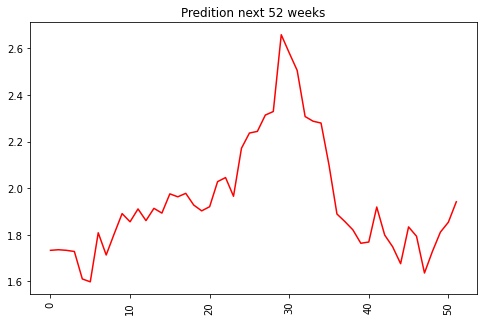

In [541]:
plt.figure(figsize = (8, 5))
plt.plot(future_forecast_1[len(arm_test):], color = 'r')
plt.xticks(rotation = 'vertical')
plt.title('Predition next 52 weeks')
plt.show()

In [472]:
arm_predict=future_forecast_1[len(arm_test):]

In [473]:
Weeks = pd.date_range('2018-03-31','2019-03-30', freq='W').strftime("%Y-%m-%d").tolist()

In [474]:
Weeks

['2018-04-01',
 '2018-04-08',
 '2018-04-15',
 '2018-04-22',
 '2018-04-29',
 '2018-05-06',
 '2018-05-13',
 '2018-05-20',
 '2018-05-27',
 '2018-06-03',
 '2018-06-10',
 '2018-06-17',
 '2018-06-24',
 '2018-07-01',
 '2018-07-08',
 '2018-07-15',
 '2018-07-22',
 '2018-07-29',
 '2018-08-05',
 '2018-08-12',
 '2018-08-19',
 '2018-08-26',
 '2018-09-02',
 '2018-09-09',
 '2018-09-16',
 '2018-09-23',
 '2018-09-30',
 '2018-10-07',
 '2018-10-14',
 '2018-10-21',
 '2018-10-28',
 '2018-11-04',
 '2018-11-11',
 '2018-11-18',
 '2018-11-25',
 '2018-12-02',
 '2018-12-09',
 '2018-12-16',
 '2018-12-23',
 '2018-12-30',
 '2019-01-06',
 '2019-01-13',
 '2019-01-20',
 '2019-01-27',
 '2019-02-03',
 '2019-02-10',
 '2019-02-17',
 '2019-02-24',
 '2019-03-03',
 '2019-03-10',
 '2019-03-17',
 '2019-03-24']

In [475]:
len(Weeks)

52

In [476]:
new_predict = pd.DataFrame({'DATE' : Weeks, 'Average Price': arm_predict})
new_predict

,DATE,Average Price
0,2018-04-01,1.73
1,2018-04-08,1.74
2,2018-04-15,1.73
3,2018-04-22,1.73
4,2018-04-29,1.61
5,2018-05-06,1.60
6,2018-05-13,1.81
7,2018-05-20,1.71
8,2018-05-27,1.80
9,2018-06-03,1.89


#### 3 year forecast

In [477]:
future_forecast_3 = stepwise_model.predict(n_periods=len(arm_test) + 52 * 3)
future_forecast_3


array([1.67455968, 1.66824061, 1.67455968, 1.6636803 , 1.58439628,
       1.54543906, 1.70840401, 1.65455968, 1.70928339, 1.82911999,
       1.81175814, 1.84911999, 1.81087876, 1.84280092, 1.88159474,
       1.96703443, 1.97511227, 2.00775042, 1.99302671, 1.95038856,
       1.91791381, 2.03423289, 2.0487932 , 1.99231072, 2.09736123,
       2.10944679, 2.17280092, 2.24280092, 2.22840401, 2.28251274,
       2.21971119, 2.19762563, 2.05010038, 2.04185914, 2.09609266,
       1.88081636, 1.71785142, 1.68241173, 1.70032617, 1.65752456,
       1.62136937, 1.75961061, 1.65136865, 1.64840444, 1.58472223,
       1.71576488, 1.67576517, 1.5212053 , 1.5931264 , 1.67856628,
       1.72400708, 1.76153159, 1.73361087, 1.73616896, 1.73361087,
       1.7286496 , 1.61089789, 1.59857215, 1.80888195, 1.71361087,
       1.80384322, 1.89113023, 1.85601406, 1.91113023, 1.86105278,
       1.91368832, 1.89330107, 1.97578171, 1.96314618, 1.97803   ,
       1.92779765, 1.90291383, 1.92074299, 2.0281849 , 2.04570

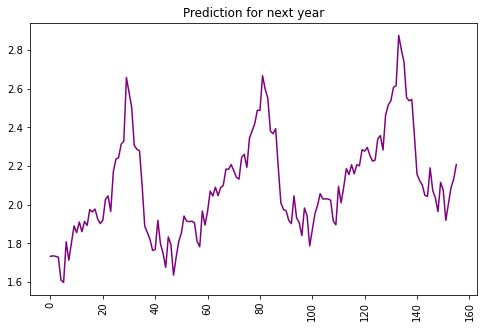

In [478]:
plt.figure(figsize=(8, 5))
plt.plot(future_forecast_3[len(arm_test):], color='purple')
plt.xticks(rotation='vertical')
plt.title("Prediction for next year")
plt.show()

In [479]:
weeks = pd.date_range(arm_test.index[-1] + timedelta(weeks=1), arm_test.index[-1] + timedelta(weeks=52 * 3), freq='W').strftime("%Y-%m-%d").tolist()

In [482]:
new_predict_3= pd.DataFrame({'Date': weeks,'AveragePrice': future_forecast_3[len(arm_test):]})
new_predict_3['Date'] = pd.to_datetime(new_predict_3['Date'])
new_predict_3 = new_predict_3.set_index('Date')

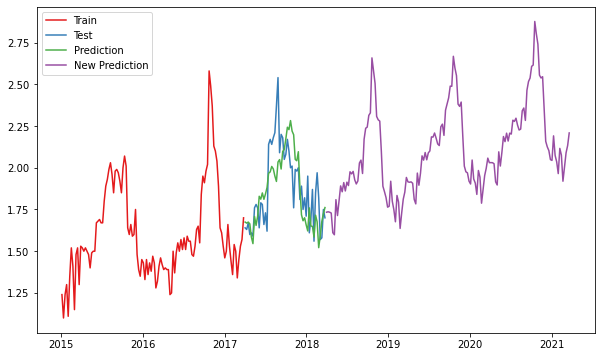

In [483]:
plt.figure(figsize=(10, 6))
plt.plot(arm_train, label='Train')
plt.plot(arm_test, label='Test')
plt.plot(future_forecast, label='Prediction')
plt.plot(new_predict_3, label='New Prediction')
plt.legend(loc='best')

#### FACEBOOK PROPHET

In [488]:
fbp_df=df3
fbp_df=df3.rename(columns={'Date':'ds', 'AveragePrice_new':'y'}).reset_index()
fbp_df=fbp_df[['ds', 'y']]
fbp_df['y']=fbp_df['y'].astype(float)
fbp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169 entries, 0 to 168
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      169 non-null    datetime64[ns]
 1   y       169 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 2.8 KB


In [489]:
fbp_df.head()

,ds,y
0,2015-01-04,1.24
1,2015-01-11,1.10
2,2015-01-18,1.24
3,2015-01-25,1.30
4,2015-02-01,1.11


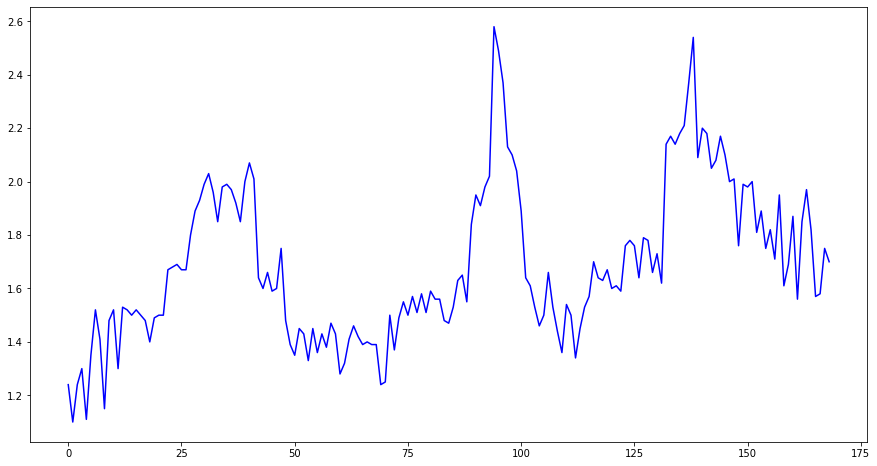

In [492]:
plt.figure(figsize = (15, 8))
plt.plot(fbp_df.y, color='blue')
plt.show()

In [504]:
fbp_train=fbp_df.iloc[:-52].reset_index(drop=True)
fbp_test=fbp_df.iloc[-52:].reset_index(drop=True)


In [505]:
len(fbp_train)

117

In [506]:
len(fbp_test)

52

In [507]:
fbp_train

,ds,y
0,2015-01-04,1.24
1,2015-01-11,1.10
2,2015-01-18,1.24
3,2015-01-25,1.30
4,2015-02-01,1.11
...,...,...
112,2017-02-26,1.34
113,2017-03-05,1.45
114,2017-03-12,1.53
115,2017-03-19,1.57


In [508]:
fbp_test

,ds,y
0,2017-04-02,1.64
1,2017-04-09,1.63
2,2017-04-16,1.67
3,2017-04-23,1.60
4,2017-04-30,1.61
5,2017-05-07,1.59
6,2017-05-14,1.76
7,2017-05-21,1.78
8,2017-05-28,1.76
9,2017-06-04,1.64


In [509]:
fbp_model = Prophet(yearly_seasonality=True, daily_seasonality=False, weekly_seasonality=False)

In [510]:
fbp_model.fit(fbp_train)

In [511]:
from datetime import timedelta
weeks= pd.date_range(fbp_test.ds.iloc[0], fbp_test.ds.iloc[-1] + timedelta(weeks=52 * 3), freq='W').strftime("%Y-%m-%d").tolist()

future = pd.DataFrame(weeks)
future.columns = ['ds']
future['ds'] = pd.to_datetime(future['ds'])

In [512]:
forecast = fbp_model.predict(future)

In [513]:
forecast[['ds','yhat']].head()

,ds,yhat
0,2017-04-02,1.67
1,2017-04-09,1.65
2,2017-04-16,1.64
3,2017-04-23,1.63
4,2017-04-30,1.62


In [530]:
forecast[['ds','yhat']].tail()

,ds,yhat
203,2021-02-21,2.64
204,2021-02-28,2.62
205,2021-03-07,2.63
206,2021-03-14,2.69
207,2021-03-21,2.76


In [514]:
# Evaluate

In [531]:
fbp_df.y.mean()

1.6852071005917157

In [532]:
fbp_test.y.mean()

1.8753846153846152

In [543]:
#y_test = fbp_test['y'].values
#y_pred = forecast['yhat'].values[-52:]

# Calculate MAE/RMSE between expected and predicted values
y_test = fbp_test['y'].values
y_pred = forecast['yhat'].values[:len(fbp_test)]
mae_p = mean_absolute_error(y_test, y_pred)
rmse_p = sqrt(mean_squared_error(y_test, y_pred))
model_results['Prophet'] = {'mae': mae_p, 'rmse': rmse_p}
print(f'Facebook Prophet mae: {mae_p:.2f}, rmse: {rmse_p:.2f}')

Facebook Prophet mae: 0.15, rmse: 0.20


In [544]:
print('Mean all data: ',  fbp_df.y.mean(), '. mae ~', mae_p/fbp_df.y.mean()*100, '%, and ', 'mse ~', rmse_p/fbp_df.y.mean()*100, '% of mean')


Mean all data:  1.6852071005917157 . mae ~ 9.153469261404286 %, and  mse ~ 11.733151177946231 % of mean


In [545]:
print('Mean test data: ',  fbp_test.y.mean(), '. mae ~', mae_p/fbp_test.y.mean()*100, '%, and ', 'mse ~', rmse_p/fbp_test.y.mean()*100, '% of mean test')

Mean test data:  1.8753846153846152 . mae ~ 8.225241514633497 %, and  mse ~ 10.543325094589154 % of mean test


In [546]:
y_test_value = pd.DataFrame(y_test, index = pd.to_datetime(fbp_test['ds']),columns=['Actual'])
y_pred_value = pd.DataFrame(y_pred, index = pd.to_datetime(fbp_test['ds']),columns=['Prediction'])


#### Visualize the result

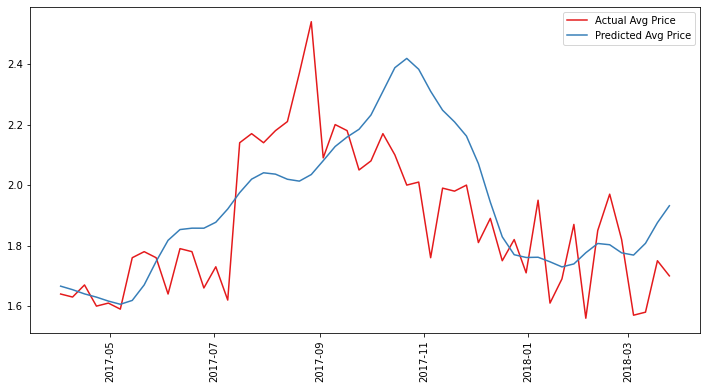

In [547]:
plt.figure(figsize=(12,6))
plt.plot(y_test_value, label='Actual Avg Price')
plt.plot(y_pred_value, label='Predicted Avg Price')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()


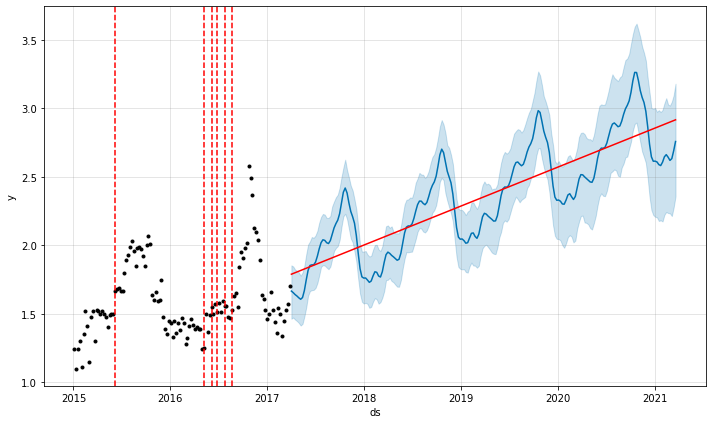

In [548]:
fig = fbp_model.plot(forecast)
fig.show()
a  = add_changepoints_to_plot(fig.gca(),fbp_model,forecast)

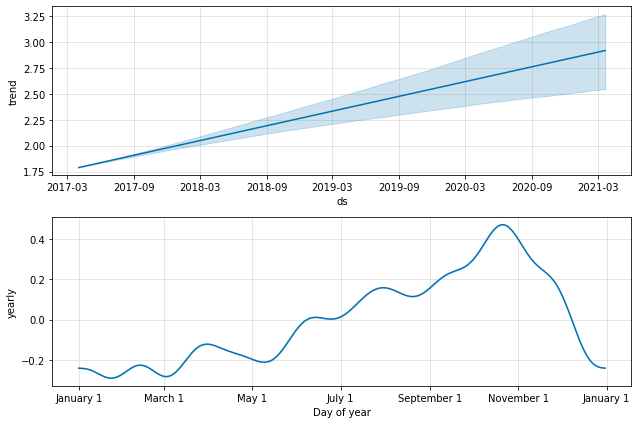

In [549]:
fig1 = fbp_model.plot_components(forecast)
fig1.show()

In [550]:
# prediction for next 1 year

In [552]:
forecast[['ds','yhat']].tail(52)

,ds,yhat
156,2020-03-29,2.52
157,2020-04-05,2.51
158,2020-04-12,2.50
159,2020-04-19,2.49
160,2020-04-26,2.48
161,2020-05-03,2.46
162,2020-05-10,2.46
163,2020-05-17,2.49
164,2020-05-24,2.56
165,2020-05-31,2.64


#### 3 year price prediction

In [553]:
m = Prophet(yearly_seasonality=True, daily_seasonality=False, weekly_seasonality=False)

In [554]:
m.fit(fbp_df)

In [555]:
future = m.make_future_dataframe(periods=52*3,freq='W')

In [556]:
forcast = m.predict(future)

In [557]:
forcast.shape

(325, 16)

In [558]:
forcast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 325 entries, 0 to 324
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ds                          325 non-null    datetime64[ns]
 1   trend                       325 non-null    float64       
 2   yhat_lower                  325 non-null    float64       
 3   yhat_upper                  325 non-null    float64       
 4   trend_lower                 325 non-null    float64       
 5   trend_upper                 325 non-null    float64       
 6   additive_terms              325 non-null    float64       
 7   additive_terms_lower        325 non-null    float64       
 8   additive_terms_upper        325 non-null    float64       
 9   yearly                      325 non-null    float64       
 10  yearly_lower                325 non-null    float64       
 11  yearly_upper                325 non-null    float64       

In [559]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'trend', 'trend_lower', 'trend_upper']].tail(12)


,ds,yhat,yhat_lower,yhat_upper,trend,trend_lower,trend_upper
196,2021-01-03,2.62,2.21,3.00,2.86,2.51,3.18
197,2021-01-10,2.61,2.20,2.97,2.86,2.52,3.19
198,2021-01-17,2.59,2.18,2.99,2.87,2.52,3.20
199,2021-01-24,2.58,2.18,2.97,2.87,2.52,3.21
200,2021-01-31,2.61,2.17,2.99,2.88,2.53,3.22
201,2021-02-07,2.65,2.22,3.04,2.88,2.53,3.22
202,2021-02-14,2.66,2.24,3.07,2.89,2.53,3.23
203,2021-02-21,2.64,2.24,3.03,2.90,2.54,3.24
204,2021-02-28,2.62,2.23,3.02,2.90,2.54,3.25
205,2021-03-07,2.63,2.21,3.05,2.91,2.54,3.25


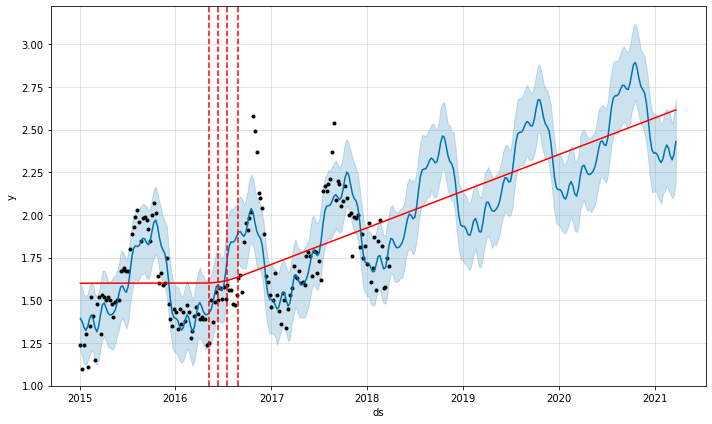

In [560]:
fig = m.plot(forcast)
fig.show()
a  = add_changepoints_to_plot(fig.gca(),m,forcast)

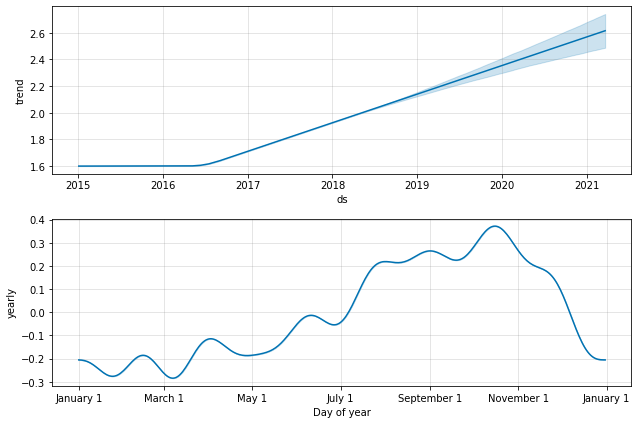

In [561]:
fig1 = m.plot_components(forcast)
fig1.show()

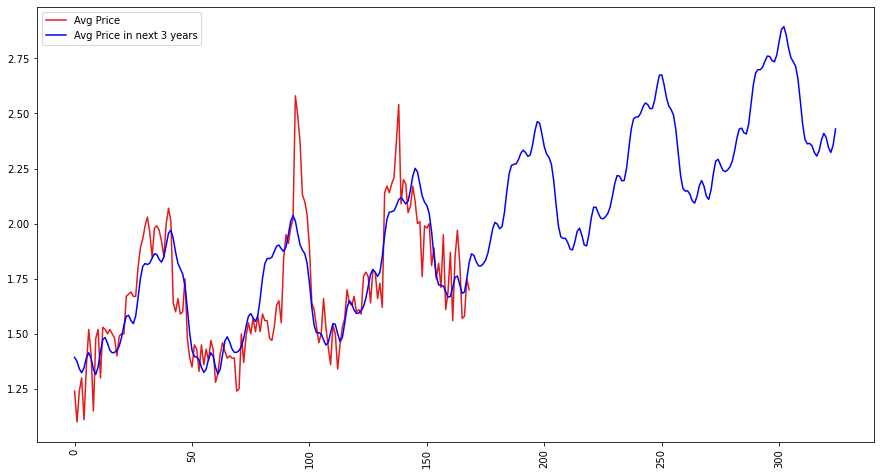

In [562]:
plt.figure(figsize=(15,8))
plt.plot(fbp_df['y'], label='Avg Price')
plt.plot(forcast['yhat'], label='Avg Price in next 3 years', 
         color='blue')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()


In [569]:
pd.DataFrame.from_dict(model_results)

,ARIMA,Prophet
mae,0.14,0.15
rmse,0.18,0.20


#### Conclusion

* Both Arima and Facebook Prophet release relatively same result in trend and seasonal.
* Arima provides better MAE and RMSE than Facebook Prophet

##### => Arima is the best model in this price forecast

Note: However, in order to evaluate the expansion chance, we should not ignore the role of consumption volume and revenue as according to law of supply and demand, the increase in price will reduce the consumption volume.

#### Review the relationship of Vol, Rev, Avg Price

In [577]:
df3.head()

,Date,region,type,Revenue,Total_Volume,AveragePrice_new,Revenue_0000
13,2015-01-04,California,organic,176513.71,142349.77,1.24,17.65
119,2015-01-11,California,organic,173921.75,158110.68,1.10,17.39
225,2015-01-18,California,organic,242057.42,195207.60,1.24,24.21
331,2015-01-25,California,organic,158207.43,121698.02,1.30,15.82
437,2015-02-01,California,organic,217595.41,196031.90,1.11,21.76


In [576]:
corr=df3.corr()
corr

,Revenue,Total_Volume,AveragePrice_new,Revenue_0000
Revenue,1.00,0.81,0.09,1.00
Total_Volume,0.81,1.00,-0.48,0.81
AveragePrice_new,0.09,-0.48,1.00,0.09
Revenue_0000,1.00,0.81,0.09,1.00


In [ ]:
df_ds=df3.sort_values('column name')

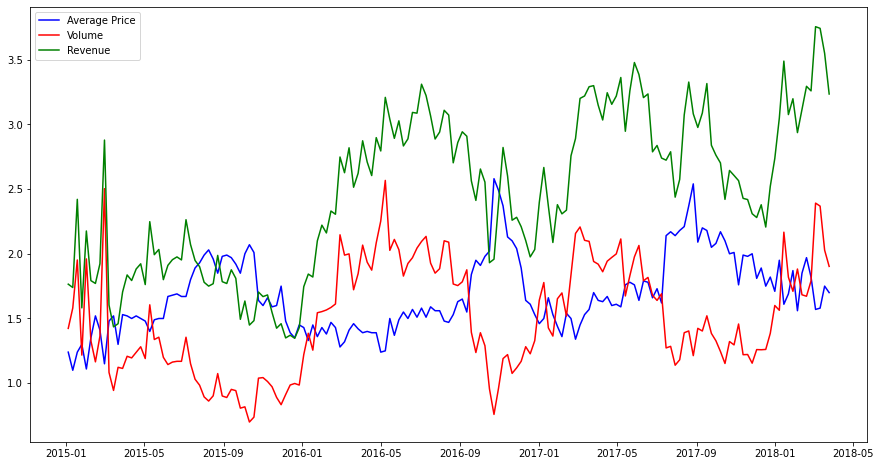

In [612]:
plt.figure(figsize=(15,8))
plt.plot(df3['Date'],df3['AveragePrice_new'], 'b')
plt.plot(df3['Date'],df3['Total_Volume']/100000, 'r')
plt.plot(df3['Date'],df3['Revenue_0000']/10, 'g')
plt.legend(['Average Price', 'Volume', 'Revenue'])
plt.show()


#### Comments:
* Correlation between Total_Volume and Average_Price is negative (-0.48)
* Correlation between Revenue and Average_Price is positive but pretty low (0.09)
* Based on the plot chart, if average price shows a slightly uptrend fluctation, revenue presents the similar trend. However, the more fierce fluction in price will reflect on the drop in revenue accordingly, following to the drop of volume 

Conclusion, the market is more likely to expand.